## Group Collaboration Notebook
#### Team members: Lucy Briggs, Carolyn Pugh, and Monisha Reginald

#### Research Question:
Where do gaps in access to grocery stores exist for seniors who live in the city of Los Angeles?<br>
#### Data Sources:
<b>US Census Data</b>:
1. ACS 2021 5-Year Estimates for Age [from Social Explorer](https://www.socialexplorer.com/reports/socialexplorer/en/report/0cc0f56c-9d1c-11ed-be9e-e30303f780e8)
2. ACS 2021 5-Year Estimates for Vehicle Ownership & Disability Status imported via API from [the United States Census Bureau](https://www.census.gov/data/developers/data-sets/acs-5year.html)
3. Total Population by Block Group for Los Angeles City [from Census Reporter](https://censusreporter.org/data/table/?table=B01003&geo_ids=16000US0644000,150|16000US0644000&primary_geo_id=16000US0644000#)
4. Population Density by Block Group for Los Angeles County [from Social Explorer](https://www.socialexplorer.com/tables/ACS2021_5yr/R13319275)

<b>Geographic Boundaries</b>:
1. Census Block Group Boundaries from [LA City GeoHub](https://geohub.lacity.org/datasets/lacounty::census-block-groups-2020/about)
2. Los Angeles City Boundary [from LA GeoHub](https://geohub.lacity.org/maps/city-boundary)
3. Los Angeles Times Neighborhood Boundaries from [from LA GeoHub](https://geohub.lacity.org/datasets/d6c55385a0e749519f238b77135eafac_0/explore?location=34.020320%2C-118.410084%2C10.96)

<b>Grocery Stores</b>:
1. SNAP Store Locations imported via API [from the USDA](https://usda-fns.hub.arcgis.com/datasets/USDA-FNS::snap-store-locations/explore?location=14.817317%2C-14.634785%2C2.79)

<b>Transit Lines and Stops</b>:
1. LA Metro Bus: https://developer.metro.net/gis-data/ 
2. LADOT: https://catalog.data.gov/dataset/ladot-dash-and-commuter-express-routes-and-stops 
3. Big Blue Bus: http://gtfs.bigbluebus.com/ 
4. LA Metro Rail: https://developer.metro.net/gis-data/ 

In [1]:
# Import basic packages.
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import fiona 
import numpy as np
import math

# Import packages for plots and maps. 
import folium
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import contextily as ctx
import plotly.express as px

# Import libraries for doing network analysis with open street map. 
import networkx as nx
import osmnx as ox

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


### Introduction

In Los Angeles, the share of the population aged 65 or older is expected to [rapidly increase in the coming decades](https://media.metro.net/docs/2019_aging_and_disability_transportation_report.pdf), making planning for their needs an urgent policy issue.  [Older adults’ health outcomes are affected by food security](https://pubmed.ncbi.nlm.nih.gov/11340107/), which is in turn mediated by the transportation system. A growing body of literature recognizes that [“it is almost as if these opportunities do not exist”](https://www.lewis.ucla.edu/research/access-to-opportunities-primer/) if the transportation system does not connect people to the places they need to go.

Improving access for seniors must account for the unique ways that they interact with the transportation system. Seniors are more reliant on public transit due to lower vehicle ownership and higher rates of physical disabilities that limit their ability to get around in other ways. In the City of Los Angeles, senior-headed households are 2x as likely to not have access to a car, and seniors are 4x as likely to have a disability. As such, analyses guiding policy interventions must account for these barriers and take into account other differences in seniors’ needs (including [lower walk speeds](https://www.researchgate.net/publication/344166318_Walkability_Index_for_Elderly_Health_A_Proposal)).

The charts below display relevant demographic data for how seniors compare to all residents within the City of Los Angeles.

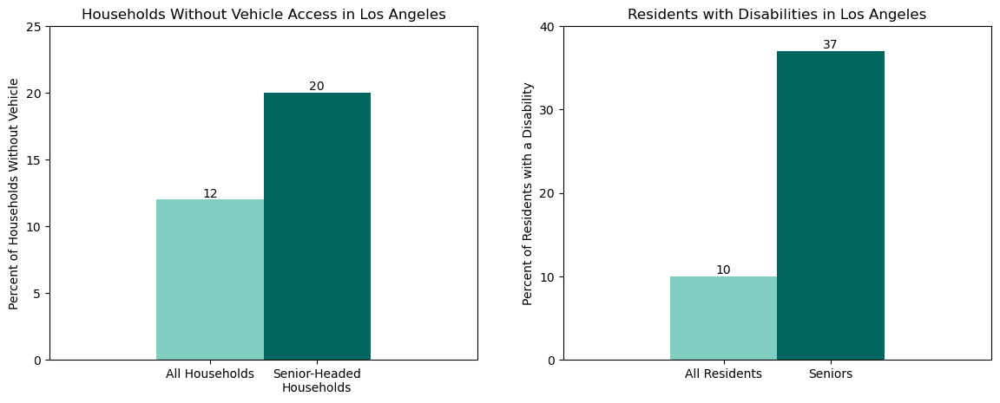

In [2]:
# Read in data containing data summarized for the City of Los Angeles.
vehicle_clean=pd.read_csv('data/vehicle_clean.csv')
disability_clean=pd.read_csv('data/disability_clean.csv')

# Start side-by-side bar plots.
fig, ax = plt.subplots(1,2,figsize=(14,5))

#Create bar plot for household vehicle access.
vehicle_clean[['Pct Households Without a Vehicle','Pct Senior-Headed Households Without a Vehicle']].plot(ax=ax[0], kind='bar', color=['#80cdc1','#01665e'], legend=False)
ax[0].bar_label(ax[0].containers[0], label_type='edge')
ax[0].bar_label(ax[0].containers[1], label_type='edge')

#Create bar plot for percentage of people with disabilities.
disability_clean[['Pct with Disability','Pct Seniors with Disability']].plot(ax=ax[1], kind='bar', color=['#80cdc1','#01665e'], legend=False)
ax[1].bar_label(ax[1].containers[0], label_type='edge')
ax[1].bar_label(ax[1].containers[1], label_type='edge')

# Adjust x-axes.
ax[0].set_xticks(ticks=[-0.125,0.125],labels=['All Households','Senior-Headed'+'\n'+'Households'],rotation=0)
ax[1].set_xticks(ticks=[-0.125,0.125],labels=['All Residents','Seniors'],rotation=0)

# Ajust y-axes.
ax[0].set_yticks((0,5,10,15,20,25))
ax[0].set_ylabel("Percent of Households Without Vehicle")
ax[1].set_yticks((0,10,20,30,40))
ax[1].set_ylabel("Percent of Residents with a Disability")

#Adjust titles.
ax[0].set_title("Households Without Vehicle Access in Los Angeles")
ax[1].set_title("Residents with Disabilities in Los Angeles")

# Save figure for final deliverables.
ax[0].set_facecolor("white")
ax[1].set_facecolor("white")
fig.set_facecolor((1, 1, 1, 0))
plt.savefig('intro_charts.png',bbox_inches="tight")
plt.show()

To understand where seniors lack access to grocery stores we will explore four metrics in this notebook:
1. Where the percentage of people who are 65 or older is the highest
2. Where seniors are the least likely to have access to a car
3. Where seniors are the least likely to be able to walk to a grocery store
4. Where there is the lowest density of bus and rail stops

Finally, we will combine these four metrics at the neighborhood and block-group level to identify areas that have the highest need for increased access

### Part 1: Where do senior residents live within the City of LA? 
In this section, we analyze which areas have higher or lower densities of older residents using census data.  We look at both the block group and neighborhood level.

### Seniors Basemap

In [3]:
#read our pre-made GeoJSON
seniors = gpd.read_file('seniors_update.geojson')
seniors.columns=['BG20', 'FIPS', 'Total Pop Density', 'Official Area', 'neighborhood',
'Total Pop', 'Age 65-74', 'Age 75-84', 'Age 85+', 'Total Senior Pop',
'Pct Seniors', 'pctcat', 'geometry']

seniors.head()

,BG20,FIPS,Total Pop Density,Official Area,neighborhood,Total Pop,Age 65-74,Age 75-84,Age 85+,Total Senior Pop,Pct Seniors,pctcat,geometry
0,1233043,060371233043,21426.740,0.045317,Valley Glen,971,182,230,197,609,62.718847,20%+,"POLYGON ((1962721.911 577050.650, 1962848.921 ..."
1,2075021,060372075021,49546.610,0.024623,Downtown,1220,63,516,182,761,62.377049,20%+,"POLYGON ((1976779.208 561139.329, 1976836.914 ..."
2,2012001,060552012001,16396.350,0.170221,El Sereno,725,238,137,42,417,57.517241,20%+,"POLYGON ((1983048.304 565141.395, 1983111.207 ..."
3,2016021,060552016021,9596.549,0.071276,El Sereno,772,333,51,58,442,57.253886,20%+,"POLYGON ((1984462.189 564266.067, 1984502.602 ..."
4,1218022,060871218022,10497.200,0.183668,Sun Valley,945,285,191,65,541,57.248677,20%+,"POLYGON ((1963463.990 580018.331, 1963563.687 ..."


This is our age data basemap made previously in week 4 and 5. I'll include the code for creating the "pctcat" field so we can change the intervals if needed.

In [4]:
seniors.loc[seniors['Pct Seniors'].between(0,20), 'pctcat'] = '0%-20%'
seniors.loc[seniors['Pct Seniors'].between(20,40), 'pctcat'] = '20%-40%'
seniors.loc[seniors['Pct Seniors'] > 40, 'pctcat'] = '40%+'

List all of the different percent categories

In [5]:
pctcats = seniors['pctcat'].unique().tolist()

Create a funciton to make binary maps using a loop. 

In [6]:
def binary():    
    for pct in pctcats:
        fig, ax = plt.subplots(figsize=(5,5))

        # create the map plot
        seniors.plot(ax=ax,
                color='#bababa')

        # create the map plot
        seniors[seniors['pctcat'] == pct].plot(ax=ax,
                # column='pctcat',
                color='#018571')

        # add a title
        ax.set_title('Census Blocks with ' + pct + ' ' + 'Residents Age 65+')
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs='epsg:6423')

        # get rid of the axis
        ax.axis('off');

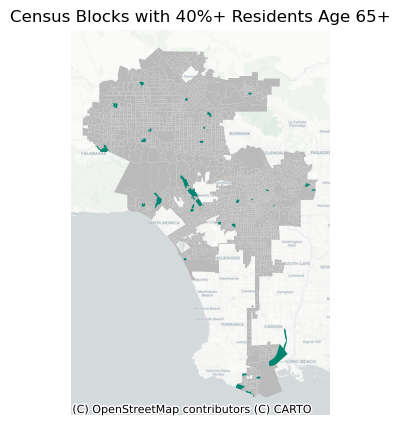

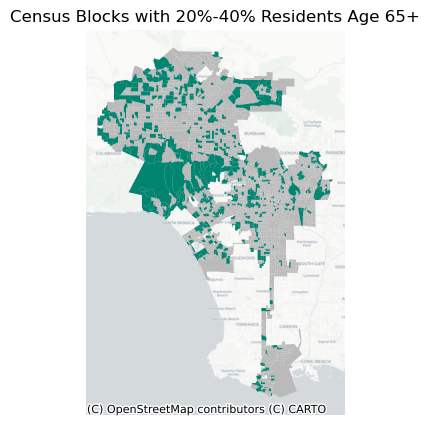

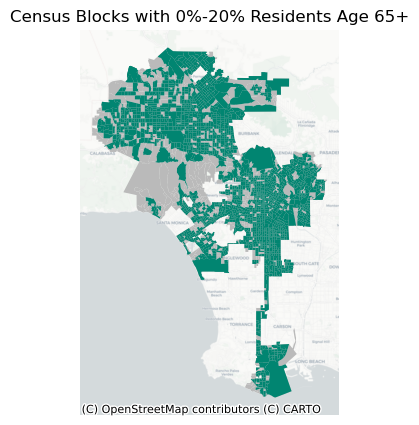

In [7]:
binary()

We can see the few tracts with the highest percentages of seniors. 

### Create a chart and map of top 10 Block Groups

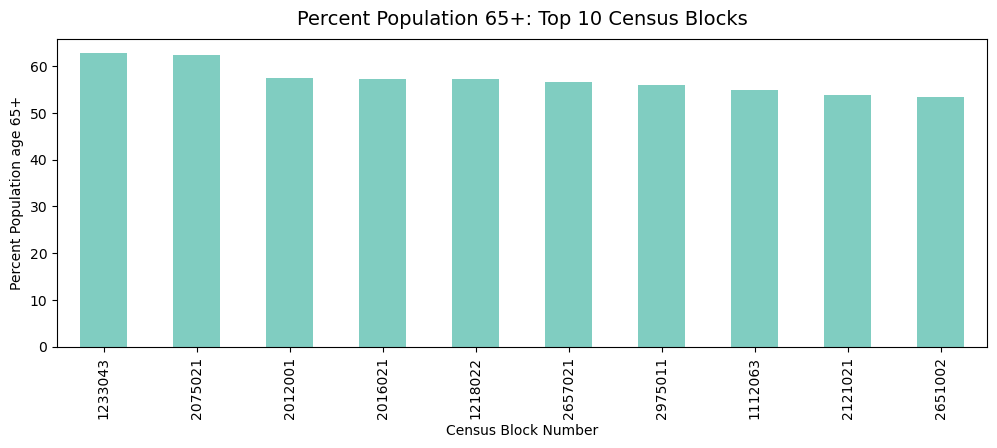

In [8]:
#plot the df
seniors.sort_values('Pct Seniors', inplace=True, ascending=False)

fig, ax = plt.subplots(figsize=(12,4))

seniors[:10].plot.bar(ax=ax,
                                      x='BG20',
                                      y='Pct Seniors',
                                      legend=False,
                                      color='#80cdc1'
                                      )
ax.set_xlabel('Census Block Number') # override x label
ax.set_ylabel('Percent Population age 65+') # override y label
ax.set_title("Percent Population 65+: Top 10 Census Blocks",fontsize=14,pad=10); # multi-line title with padding
fig.savefig('top10blockchart.png', bbox_inches='tight')

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


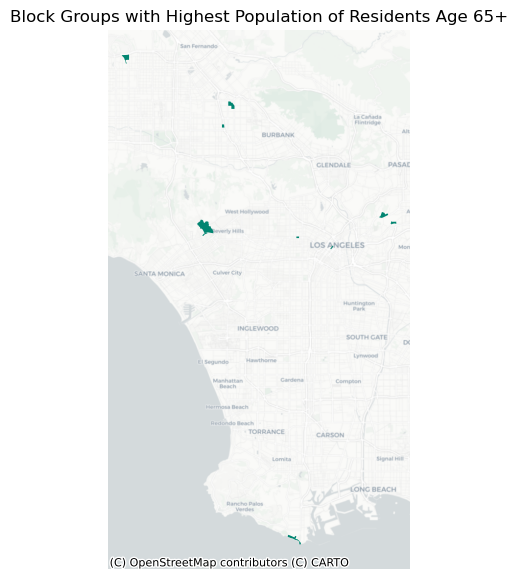

In [9]:
seniors.sort_values('Pct Seniors', inplace=True, ascending=False)

fig, ax = plt.subplots(figsize=(7,7))
seniors[:10].plot(ax=ax, 
                  column='Pct Seniors',
                  color='#018571')
ax.set_title('Block Groups with Highest Population of Residents Age 65+')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs='epsg:6423')
ax.axis('off');
fig.savefig('top10blockmap.png', bbox_inches='tight')

In [10]:
seniors.head()

,BG20,FIPS,Total Pop Density,Official Area,neighborhood,Total Pop,Age 65-74,Age 75-84,Age 85+,Total Senior Pop,Pct Seniors,pctcat,geometry
0,1233043,060371233043,21426.740,0.045317,Valley Glen,971,182,230,197,609,62.718847,40%+,"POLYGON ((1962721.911 577050.650, 1962848.921 ..."
1,2075021,060372075021,49546.610,0.024623,Downtown,1220,63,516,182,761,62.377049,40%+,"POLYGON ((1976779.208 561139.329, 1976836.914 ..."
2,2012001,060552012001,16396.350,0.170221,El Sereno,725,238,137,42,417,57.517241,40%+,"POLYGON ((1983048.304 565141.395, 1983111.207 ..."
3,2016021,060552016021,9596.549,0.071276,El Sereno,772,333,51,58,442,57.253886,40%+,"POLYGON ((1984462.189 564266.067, 1984502.602 ..."
4,1218022,060871218022,10497.200,0.183668,Sun Valley,945,285,191,65,541,57.248677,40%+,"POLYGON ((1963463.990 580018.331, 1963563.687 ..."


### Creating a Seniors Basemap by Neighborhood in addition to the Block Group data
We will examine the seniors data on the block group and neighborhood level. 

In [11]:
# Import neighborhood boundaries directly from LA GeoHub.
neighborhoods=gpd.read_file(
    'https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson').to_crs('epsg:6423').rename(columns={'name' : 'neighborhood'})
neighborhoods = neighborhoods.to_crs(4326) #converting to the projection of our Seniors data

Steps: 

1. Group by neighborhood and sum the other columns
2. Fix the percentages that were added up
3. Merge the new grouped dataframe with neighborhoods data to get the Geometry column back 

In [12]:
#group by neighborhood and add up the other columns
neighborhood_seniors = seniors.groupby(['neighborhood']).sum(numeric_only=True).reset_index()

#fix the percentage colums
neighborhood_seniors['Pct Seniors']=(neighborhood_seniors['Total Senior Pop']/neighborhood_seniors['Total Pop'])*100

#merge to neighborhoods data to get the geometry column back
neighborhood_seniors=pd.merge(neighborhoods,neighborhood_seniors,how="left", 
                              on=['neighborhood'])

Now we should have a dataframe that shows our seniors data on the neighborhood level. Create a plot of the highest percentages of senior population. This chart is more useful than our original census block plot, as neighborhoods are more recognizable. 

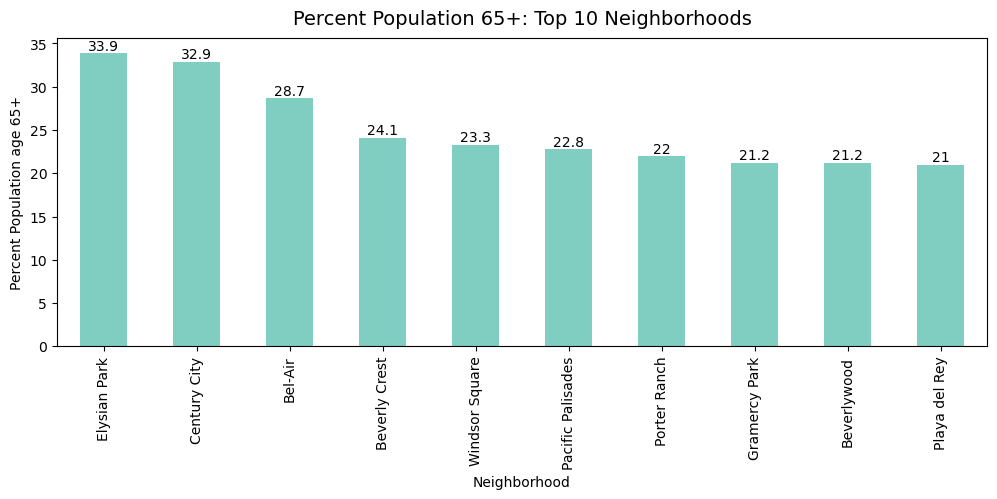

In [13]:
#plot the df
neighborhood_seniors.sort_values('Pct Seniors', inplace=True, ascending=False) #sort to see top 10
neighborhood_seniors['Pct Seniors'] = round(neighborhood_seniors['Pct Seniors'], 1) #round to one decimal place for bar labels
fig, ax = plt.subplots(figsize=(12,4))

neighborhood_seniors[:10].plot.bar(ax=ax,
                                      x='neighborhood',
                                      y='Pct Seniors',
                                      legend=False,
                                      color='#80cdc1'
                                      )
ax.bar_label(ax.containers[0], label_type='edge')
ax.set_xlabel('Neighborhood') # override x label
ax.set_ylabel('Percent Population age 65+') # override y label
ax.set_title("Percent Population 65+: Top 10 Neighborhoods",fontsize=14,pad=10); # multi-line title with padding
fig.savefig('top10neighb.png', bbox_inches='tight')

Elysian Park is the neighborhood with the highest percentage of seniors age 65+. 

Now we will create a map of the top 10 neighborhoods for additional clarity. 

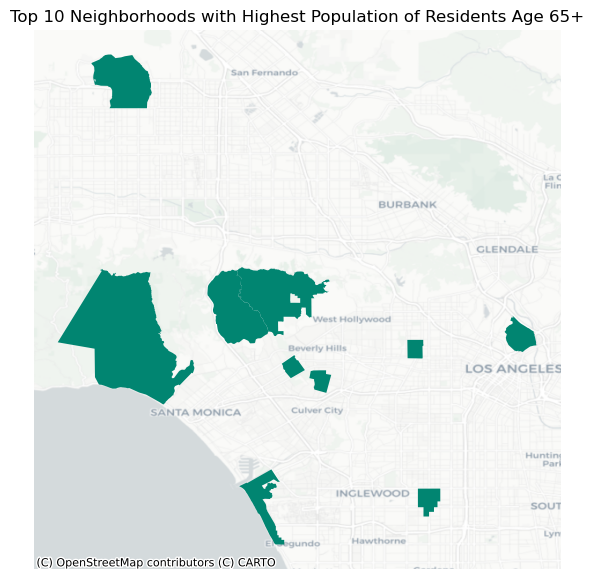

In [14]:
fig, ax = plt.subplots(figsize=(7,7))
neighborhood_seniors[:10].plot(ax=ax, 
                              color='#018571')
ax.set_title('Top 10 Neighborhoods with Highest Population of Residents Age 65+')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=4326)
ax.axis('off');
#fig.savefig('top10neighbmap.png', bbox_inches='tight')

Now we have maps of the top 10 block groups and the top 10 neighborhoods. 

Experimenting with one more folium map for StoryMap

In [15]:
seniors = seniors.to_crs(4326) #projecting 
seniors.sort_values('Pct Seniors', inplace=True, ascending=False) #Sorting by highest % Seniors

m = folium.Map(location=[34.001,-118.2897], 
               zoom_start = 10.45,
               tiles='CartoDB positron', 
               attribution='CartoDB')
#plot BG polygons
for _, r in seniors[:10].iterrows():
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_k = sim_geo.to_json()
    geo_k = folium.GeoJson(data=geo_k,
                           style_function=lambda x:{'fillColor': '#018571', "color": "#018571", 'weight': 1.5})
    folium.Popup(r["Pct Seniors"], max_width=2650).add_to(geo_k)
    geo_k.add_to(m)
    
#plot neighborhood polygons
for _, r in neighborhood_seniors[:10].iterrows():
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x:{'fillColor': '#a6611a', "color": "#a6611a", 'weight': 1.5})
    folium.Popup(r['neighborhood']).add_to(geo_j)
    geo_j.add_to(m)

m

In [16]:
m.save('top10.html')

# Metro Micro

The Metro Micro zones represent areas that already have good access to grocery stores for seniors, as they allow seniors to access transit without walking far to or from their destination or a transit stop. The purpose of our project is to determine where the gaps in transit are across the city, so we must account for Metro Micro zones. In essence, we want to identify potential areas for additional Metro Micro expansion. 
To begin: import our metro micro geojson created in week 4.

In [17]:
micro = gpd.read_file('data/micro.geojson')
micro.sample(5)

,name,geometry
1,MOD - El Monte,"POLYGON Z ((-118.08420 34.10368 0.00000, -118...."
6,UCLA / Westwood,"POLYGON Z ((-118.42059 34.05032 0.00000, -118...."
0,Watts Willowbrook,"POLYGON Z ((-118.26535 33.95297 0.00000, -118...."
5,San Fernando Valley,"POLYGON Z ((-118.51977 34.23579 0.00000, -118...."
3,LAX Update,"POLYGON Z ((-118.44440 33.96200 0.00000, -118...."


# 

Map the metro micro zones with folium

In [18]:
m = folium.Map(location=[34.1,-118.3], 
               zoom_start = 10.45,
               tiles='CartoDB positron', 
               attribution='CartoDB')
#plot polygons
for _, r in micro.iterrows():
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.001)
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'fillColor': '#a6611a', "color": "#018571", 'weight': 1.5})
    folium.Popup(r['name']).add_to(geo_j)
    geo_j.add_to(m)
m

In [19]:
m.save('metromicro.html')

### Part 2: Where do Seniors Lack Access to a Vehicle in Los Angeles?

First, we read in the geojson created in the [Prep Notebook](https://github.com/lucybriggs12/snakeemoji/blob/f0655d8afcd56f4be4710069018a16b85f30cb17/Group%20Assignments/Week%2008/Prep_Notebook.ipynb), which contains information about vehicle ownership for all block groups in the City of Los Angeles.

In [20]:
vehicle_access=gpd.read_file('vehicle_access.geojson')

We know that seniors are twice as likely not to have access to a vehicle, but we want to understand how vehicle access varies by geography. To do this, we will aggregate data by neighborhood and then recalculate car ownership rates.

In [21]:
# Import neighborhood boundaries directly from LA GeoHub.
neighborhoods=gpd.read_file(
    'https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson').to_crs('epsg:6423').rename(columns={'name' : 'neighborhood'})

In [22]:
# Create a new dataframe with totals for each neighborhood that sums up all relevant columns.
vehicles_by_neighborhood = vehicle_access.groupby(['neighborhood']).sum(numeric_only=True).reset_index()

# Recalculate percentages.
vehicles_by_neighborhood['Pct Households Without a Vehicle']=(vehicles_by_neighborhood['Total No Vehicle']/vehicles_by_neighborhood['Total HH'])*100
vehicles_by_neighborhood['Pct Senior-Headed Households Without a Vehicle']=(vehicles_by_neighborhood['Senior No Vehicle']/vehicles_by_neighborhood['Senior HH'])*100

# Finally, we have to add back in the geometry column from the original neighborhood geodataframe.
vehicles_by_neighborhood=pd.merge(neighborhoods[['neighborhood','geometry']],vehicles_by_neighborhood,how="left", on=['neighborhood'])

# See how this table looks.
vehicles_by_neighborhood.head()

,neighborhood,geometry,Total HH,Senior HH,Total No Vehicle,Senior No Vehicle,Pct Households Without a Vehicle,Pct Senior-Headed Households Without a Vehicle
0,Adams-Normandie,"POLYGON ((1972233.388 559643.685, 1971938.035 ...",5141,915,960,294,18.673410,32.131148
1,Arleta,"POLYGON ((1959244.309 584850.051, 1959257.540 ...",7950,1791,337,164,4.238994,9.156896
2,Arlington Heights,"POLYGON ((1970582.552 561395.372, 1970757.410 ...",6220,1151,940,256,15.112540,22.241529
3,Atwater Village,"MULTIPOLYGON (((1974284.934 572493.221, 197428...",4782,1207,279,126,5.834379,10.439105
4,Baldwin Hills/Crenshaw,"POLYGON ((1966656.952 558331.179, 1966727.113 ...",14391,3609,2323,835,16.142033,23.136603


We will create a choropleth map by neighborhood to summarize vehicle access by neighborhood.

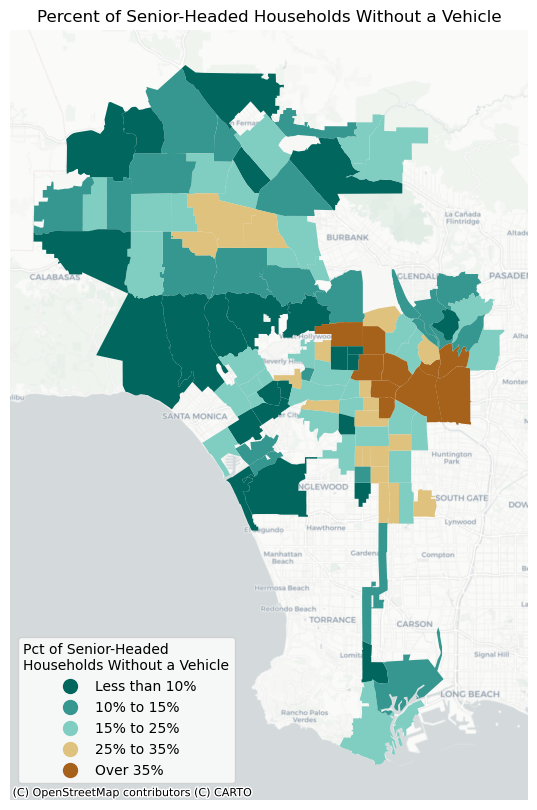

In [23]:
# Add in colors based on the percent of households that don't have a car for mapping.
for index, row in vehicles_by_neighborhood.iterrows():
    if vehicles_by_neighborhood.loc[index, 'Pct Senior-Headed Households Without a Vehicle'] < 10:
        vehicles_by_neighborhood.loc[index, 'colors'] = '#01665e'
    elif vehicles_by_neighborhood.loc[index, 'Pct Senior-Headed Households Without a Vehicle'] < 15:
        vehicles_by_neighborhood.loc[index, 'colors'] = '#35978f'
    elif vehicles_by_neighborhood.loc[index, 'Pct Senior-Headed Households Without a Vehicle'] < 25:
        vehicles_by_neighborhood.loc[index, 'colors'] = '#80cdc1'
    elif vehicles_by_neighborhood.loc[index, 'Pct Senior-Headed Households Without a Vehicle'] < 35:
        vehicles_by_neighborhood.loc[index, 'colors'] = '#dfc27d'
    elif vehicles_by_neighborhood.loc[index, 'Pct Senior-Headed Households Without a Vehicle'] <= 100:
        vehicles_by_neighborhood.loc[index, 'colors'] = '#a6611a'
    else:
        vehicles_by_neighborhood.loc[index, 'colors'] = '#f7f7f5'

        # Map neighborhoods.
fig,ax = plt.subplots(figsize=(8,10))
vehicles_by_neighborhood.plot(ax=ax,color=vehicles_by_neighborhood['colors'])

legend_elements = [(Line2D([0], [0], marker='o', color='#01665e', linestyle='',label='Less than 10%', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#35978f', linestyle='',label='10% to 15%', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#80cdc1', linestyle='',label='15% to 25%', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#dfc27d', linestyle='',label='25% to 35%', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#a6611a', linestyle='',label='Over 35%', markersize=10))]
fig.legend(handles=legend_elements,loc='center left', bbox_to_anchor=(0.19,.2), title="Pct of Senior-Headed \nHouseholds Without a Vehicle")


ax.axis('off')
ax.set_title('Percent of Senior-Headed Households Without a Vehicle')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs='epsg:6423')
plt.savefig('vehicle_map.png',bbox_inches="tight",transparent=True)

From this map we can see that vehicle ownership is the lowest in Central LA and the Eastside and is also relatively low in South LA and the part of the San Fernando Valley near Van Nuys. Now, we'll create a bar graph to drill down on the 10 neighborhoods where senior-headed households are the least likely to own a vehicle.

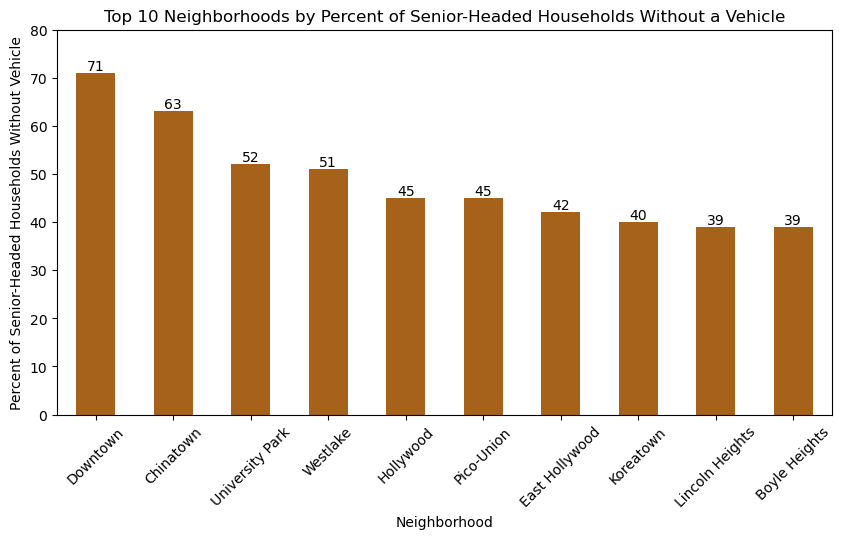

In [24]:
# Create a dataframe for chart with sorted, rounded percentages (so that they can be displayed).
neighborhood_bar=vehicles_by_neighborhood[['neighborhood','Pct Senior-Headed Households Without a Vehicle']].round().sort_values(by=['Pct Senior-Headed Households Without a Vehicle'],ascending=False)

# Start plot.
fig, ax = plt.subplots(figsize=(10,5))
ax = neighborhood_bar[:10].plot(ax=ax, kind='bar', x='neighborhood', y= 'Pct Senior-Headed Households Without a Vehicle', color=['#a6611a'], legend=False)
ax.bar_label(ax.containers[0], label_type='edge')

# Adjust x-axis.
plt.xlabel("Neighborhood")
plt.xticks(rotation=45)

# Ajust y-axis.
plt.ylabel("Percent of Senior-Headed Households Without Vehicle")
ax.set_yticks((0,10,20,30,40,50,60,70,80))

#Adjust table and legend.
plt.title("Top 10 Neighborhoods by Percent of Senior-Headed Households Without a Vehicle")

fig.set_facecolor((1, 1, 1, 0))
ax.set_facecolor("white")

plt.savefig('vehicle_chart.png',bbox_inches="tight")
plt.show()

From this chart, we can see that seniors who live in Downtown and Chinatown are significant outliers with respect to vehicle ownership, even though vehicle ownership is generally low throughout Central LA and the Eastside.

### Part 3: What does grocery store access look like in Los Angeles?

To understand where grocery stores are located in the City of Los Angeles, we used data from the USDA on the  locations of authorized SNAP retailers . The majority of locations that accept EBT are small convenient stores, so we used just the chain supermarkets (e.g., Ralphs, Smart and Final) from this dataset. We would prefer to include small independent grocery retailers in further analysis, because these smaller retailers are an important source of fresh and healthy food, particularly for immigrant populations. However, there was no way to systematically differentiate between independent convenient stores and independent grocery stores, and the vast majority of locations in the raw data fall into the former category.   
<br>First, we read in the geojson created in the [Prep Notebook](https://github.com/lucybriggs12/snakeemoji/blob/f0655d8afcd56f4be4710069018a16b85f30cb17/Group%20Assignments/Week%2008/Prep_Notebook.ipynb), which contains information about the grocery stores. For initial analysis, we want to analyze just grocery chains within the municipal border.

In [25]:
# Read file.
grocery_chains=gpd.read_file('chain_with_neighborhood.geojson')

# Create new geodataframe with just chains within the City of LA.
chain_with_neighborhood=grocery_chains[grocery_chains['neighborhood'].notna()].copy().reset_index().drop(columns=['index'])

We want to make a map of grocery stores in Los Angeles categorized by their chain. However, there are too many supermarket chains to map them with every chain as its own category, so I will create a new dataframe for the primary purpose of mapping. This new dataframe will contain a column (chain_map) that contains the chain's name for very big chains, and the chain type for smaller chains. First, I determine what the top 5 chains are.

In [26]:
# Display fist five items in a new dataframe with counts of each chain.
top_chains = chain_with_neighborhood.value_counts(['chain_name']).reset_index(name='count').iloc[:5]
top_chains

,chain_name,count
0,Ralphs,43
1,Target,30
2,Smart & Final,30
3,Trader Joe's,22
4,Food 4 Less,21


Now I can use this information to create my new chain_map categories.

In [27]:
#Create new geodataframe for map.
chain_map=chain_with_neighborhood.copy()

# Create new variable that defaults to the chain type.
chain_map['chain_map'] = chain_map['chain_type']

# Replace value with the chain's name for Top 5 Chains.
chain_map.loc[chain_map['chain_name'] == "Ralphs", 'chain_map'] = "Ralphs"
chain_map.loc[chain_map['chain_name'] == "Smart & Final", 'chain_map'] = "Smart & Final"
chain_map.loc[chain_map['chain_name'] == "Target", 'chain_map'] = "Target"
chain_map.loc[chain_map['chain_name'] == "Trader Joe's", 'chain_map'] = "Trader Joe's"
chain_map.loc[chain_map['chain_name'] == "Food 4 Less", 'chain_map'] = "Food 4 Less"

# See how many stores there are in each mapping category.
chainmap_counts = chain_map.value_counts(['chain_map']).reset_index(name='count')
chainmap_counts

,chain_map,count
0,"Standard chain (e.g. Ralphs, Trader Joe's)",102
1,Ralphs,43
2,"Upscale (e.g. Whole Foods, Sprouts)",38
3,Smart & Final,30
4,Target,30
5,"Discount (e.g. Smart & Final, Food 4 Less)",25
6,Trader Joe's,22
7,Food 4 Less,21
8,"Department store (e.g. Target, Walmart)",5


I notice that by pulling the Targets out separately, there aren't enough department stores to map as a category, so I'll fold these into standard chains.

In [28]:
chain_map.loc[chain_map['chain_name'] == "Walmart", 'chain_map'] = "Standard chain (e.g. Ralphs, Trader Joe's)"

Finally, I must rename my categories to remove references to chains that have been pulled out.

In [29]:
chain_map.loc[chain_map['chain_map'] == "Standard chain (e.g. Ralphs, Trader Joe's)", 'chain_map'] = "Other Standard Chain (e.g. Vons)"
chain_map.loc[chain_map['chain_map'] == "Discount (e.g. Smart & Final, Food 4 Less)", 'chain_map'] = "Other Discount Chain (e.g. Mother's Nutritional Center)"
chain_map.loc[chain_map['chain_map'] == "Upscale (e.g. Whole Foods, Sprouts)", 'chain_map'] = "Upscale Chain (e.g. Whole Foods)"

# See how many stores there are in each mapping category.
chainmap_counts = chain_map.value_counts(['chain_map']).reset_index(name='count')
chainmap_counts

,chain_map,count
0,Other Standard Chain (e.g. Vons),107
1,Ralphs,43
2,Upscale Chain (e.g. Whole Foods),38
3,Smart & Final,30
4,Target,30
5,Other Discount Chain (e.g. Mother's Nutritiona...,25
6,Trader Joe's,22
7,Food 4 Less,21


Now I can create an interactive map that has the locations of each supermarket chain grocery store in the City of LA. This map helps us understand the spatial distribution of chains overall and _which_ chains are in which areas.

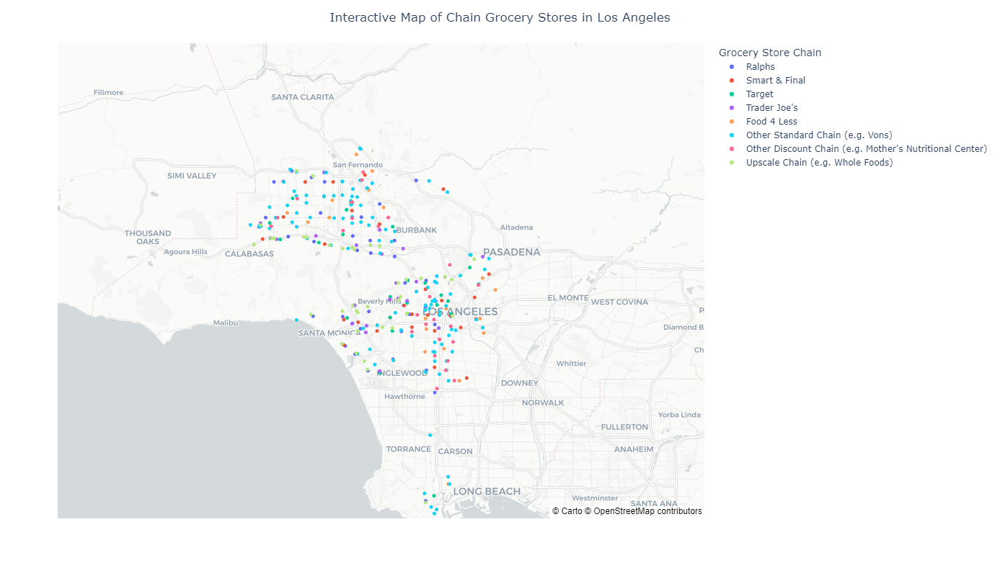

In [30]:
# Create an order column with the desired order (in the legend I want first the top 5 chains in descending order of prevalence and then the chain groups)
chain_map.loc[chain_map['chain_map'] == "Ralphs", 'chain_map_order'] = 1
chain_map.loc[chain_map['chain_map'] == "Smart & Final", 'chain_map_order'] = 2
chain_map.loc[chain_map['chain_map'] == "Target", 'chain_map_order'] = 3
chain_map.loc[chain_map['chain_map'] == "Trader Joe's", 'chain_map_order'] = 4
chain_map.loc[chain_map['chain_map'] == "Food 4 Less", 'chain_map_order'] = 5
chain_map.loc[chain_map['chain_map'] == "Other Standard Chain (e.g. Vons)", 'chain_map_order'] = 6
chain_map.loc[chain_map['chain_map'] == "Other Discount Chain (e.g. Mother's Nutritional Center)", 'chain_map_order'] = 7
chain_map.loc[chain_map['chain_map'] == "Upscale Chain (e.g. Whole Foods)", 'chain_map_order'] = 8

# Sort by my new order column.
chain_map=chain_map.sort_values('chain_map_order')

# Create an interactive map where markers are colored by the name of the chain.
fig = px.scatter_mapbox(chain_map,
                        lat='Latitude',
                        lon='Longitude',
                        color='chain_map',
                        mapbox_style="carto-positron",
                        labels={
                            'chain_map':'Grocery Store Chain',
                        })

# Update layout with desired size, zoom, title, etc.
# Chart specifically must be wider to accomodate the longer names in the legend.
fig.update_layout(
    width = 950,
    height = 800,
    mapbox_style="carto-positron",
    mapbox_zoom=9,
    title = "Interactive Map of Chain Grocery Stores in Los Angeles",
    title_x=0.5,
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)')
fig.write_html('chain_map.html')
fig.show()

Exploring this map helps us understand geographic trends in how residential segregation and food affordability are related. While "Discount Chains" are concentrated in South LA, "Upscale Chains" are generally concentrated in West LA and along the 101. Although price range was outside the scope of this analysis, these trends would be interesting to explore further in future research.

Now we turn our attention to the question of which areas are within walking distance of a grocery store. First, we'll read in the geojsons that we'll need, with the most notable one being the dataframe of walksheds created in the  [Prep Notebook](https://github.com/lucybriggs12/snakeemoji/blob/7f0fee81acd93bdcb55dc1bb5f69d088fdcf0100/Group%20Assignments/Week%2008/Prep_Notebook.ipynb).

In [31]:
# Read the geojson from the prep notebook that has walkshed geometries.
walksheds=gpd.read_file('grocery_walksheds.geojson')

# Read the geojson from the prep notebook that has census block group geometries.
bg_geometries=gpd.read_file('bg_geometries.geojson')

# Import LA City boundary directly from Los Angeles GeoHub. 
cityboundary_proj=gpd.read_file("https://maps.lacity.org/lahub/rest/services/Boundaries/MapServer/7/query?outFields=*&where=1%3D1&f=geojson").to_crs('epsg:6423')

# Import neighborhood boundaries directly from LA GeoHub.
neighborhoods=gpd.read_file(
    'https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson').to_crs('epsg:6423').rename(columns={'name' : 'neighborhood'})

# Read the geojson from the prep notebook that has population access.
senior_grocery=gpd.read_file('senior_grocery.geojson')

The geoprocessing occured in our [Prep Notebook](https://github.com/lucybriggs12/snakeemoji/blob/f0655d8afcd56f4be4710069018a16b85f30cb17/Group%20Assignments/Week%2008/Prep_Notebook.ipynb), but our methodology is described in the following diagram.

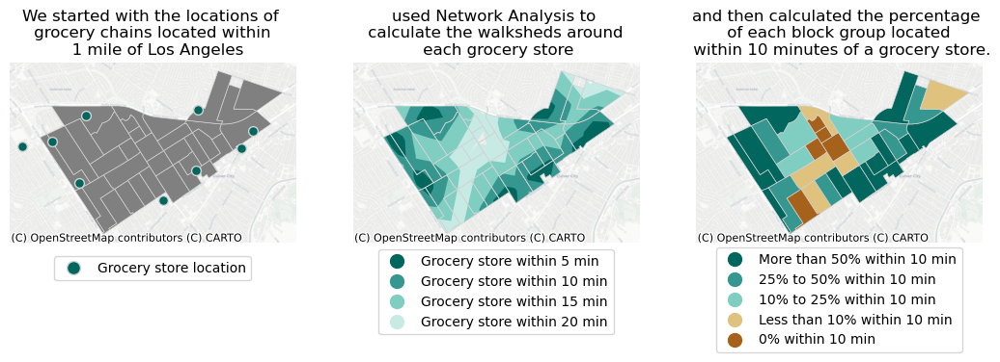

In [32]:
# Get all block groups within the neighborhood.
neighborhood_bgs=senior_grocery[senior_grocery['neighborhood']=='Palms']
# Overlay this new geographic extent with the walksheds to get just walksheds within the neighborhoods.    
neighborhood_walkshed=gpd.overlay(walksheds,neighborhood_bgs,how='intersection', keep_geom_type=None, make_valid=True)
# Clip point data to get just points within 1140 meters of the neighborhoods.
neighborhood_bgs_buffer=neighborhood_bgs.buffer(570)
neighborhood_stores=gpd.clip(grocery_chains,neighborhood_bgs_buffer)

# Map all three subplots.
fig, ax = plt.subplots(1, 3, figsize=(13, 12))
neighborhood_bgs.plot(ax=ax[0],color="grey",edgecolor='lightgrey',lw=0.5)
neighborhood_stores.plot(ax=ax[0],marker='o',color='#01665e', edgecolor='lightgrey',markersize=50)
neighborhood_stores.plot(ax=ax[1],alpha=0)
neighborhood_walkshed.plot(ax=ax[1],color=neighborhood_walkshed['colors_1'])
neighborhood_bgs.plot(ax=ax[1],color="None",edgecolor='lightgrey',lw=0.5)
neighborhood_stores.plot(ax=ax[2],alpha=0)
neighborhood_bgs.plot(ax=ax[2],color=neighborhood_bgs['colors'],edgecolor='lightgrey',lw=0.5)

# Create custom legend
from matplotlib.lines import Line2D
legend_elements1 = [(Line2D([0], [0], marker='o', color='#01665e', linestyle='', markeredgecolor='lightgrey', label='Grocery store location', markersize=10))]
ax[0].legend(handles=legend_elements1,loc='lower center', bbox_to_anchor=(0.5,-0.25))
ax[0].axis("off")
ax[0].set_title("We started with the locations of \n grocery chains located within \n  1 mile of Los Angeles")
ctx.add_basemap(ax=ax[0], source=ctx.providers.CartoDB.Positron, crs='epsg:6423')

legend_elements2 = [(Line2D([0], [0], marker='o', color='#01665e', linestyle='',label='Grocery store within 5 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#35978f', linestyle='',label='Grocery store within 10 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#80cdc1', linestyle='',label='Grocery store within 15 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#c7eae5', linestyle='',label='Grocery store within 20 min', markersize=10))]
ax[1].legend(handles=legend_elements2,loc='lower center', bbox_to_anchor=(0.5,-0.55))
ax[1].axis("off")
ax[1].set_title("used Network Analysis to \n calculate the walksheds around \n each grocery store")
ctx.add_basemap(ax=ax[1], source=ctx.providers.CartoDB.Positron, crs='epsg:6423')

legend_elements3 = [(Line2D([0], [0], marker='o', color='#01665e', linestyle='',label='More than 50% within 10 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#35978f', linestyle='',label='25% to 50% within 10 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#80cdc1', linestyle='',label='10% to 25% within 10 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#dfc27d', linestyle='',label='Less than 10% within 10 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#a6611a', linestyle='',label='0% within 10 min', markersize=10))]
ax[2].legend(handles=legend_elements3,loc='lower center', bbox_to_anchor=(0.5,-0.65))
ax[2].axis("off")
ax[2].set_title("and then calculated the percentage \n of each block group located \n within 10 minutes of a grocery store.")
ctx.add_basemap(ax=ax[2], source=ctx.providers.CartoDB.Positron, crs='epsg:6423')

plt.savefig('grocery_walk_methodology.png',bbox_inches="tight",transparent=True)
plt.show()

We can use this information to do some basic calculations about how likely Seniors are to live within walking distance of a grocery chain, and whether they have worse (or better) acess than the general population of Los Angeles. To do these calculations, we created a new table that sums up all of the data across all block groups.

In [33]:
# Sum up all of the data for all of the block groups in each category.
senior_sums = senior_grocery.sum(numeric_only=True)
senior_sums=pd.DataFrame(senior_sums).transpose()
senior_sums['pct_5_min']=round(100*senior_sums['all_5_min']/senior_sums['Total_Pop'])
senior_sums['pct_10_min']=round(100*senior_sums['all_10_min']/senior_sums['Total_Pop'])
senior_sums['pct_15_min']=round(100*senior_sums['all_15_min']/senior_sums['Total_Pop'])
senior_sums['pct_none']=round(100*senior_sums['all_none']/senior_sums['Total_Pop'])
senior_sums['seniors_pct_5_min']=round(100*senior_sums['seniors_5_min']/senior_sums['Total Senior Pop'])
senior_sums['seniors_pct_10_min']=round(100*senior_sums['seniors_10_min']/senior_sums['Total Senior Pop'])
senior_sums['seniors_pct_15_min']=round(100*senior_sums['seniors_15_min']/senior_sums['Total Senior Pop'])
senior_sums['seniors_none']=round(100*senior_sums['seniors_none']/senior_sums['Total Senior Pop'])


senior_sums_all=senior_sums[['pct_5_min','pct_10_min','pct_15_min','pct_none']]
senior_sums_all['population']='All Residents'
senior_sums_seniors=senior_sums[['seniors_pct_5_min','seniors_pct_10_min','seniors_pct_15_min','seniors_none']].rename(columns={
    'seniors_pct_5_min':'pct_5_min', 'seniors_pct_10_min':'pct_10_min', 'seniors_pct_15_min':'pct_15_min', 'seniors_none':'pct_none'})
senior_sums_seniors['population']='Seniors'
grocery_table=pd.concat([senior_sums_all,senior_sums_seniors])
grocery_table=grocery_table.reset_index().drop(columns=['index','pct_15_min'])

# Take a look at our table.
grocery_table

/tmp/ipykernel_1460/1330527046.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,pct_5_min,pct_10_min,pct_none,population
0,4.0,20.0,80.0,All Residents
1,4.0,18.0,82.0,Seniors


Now we can create our bar plot.

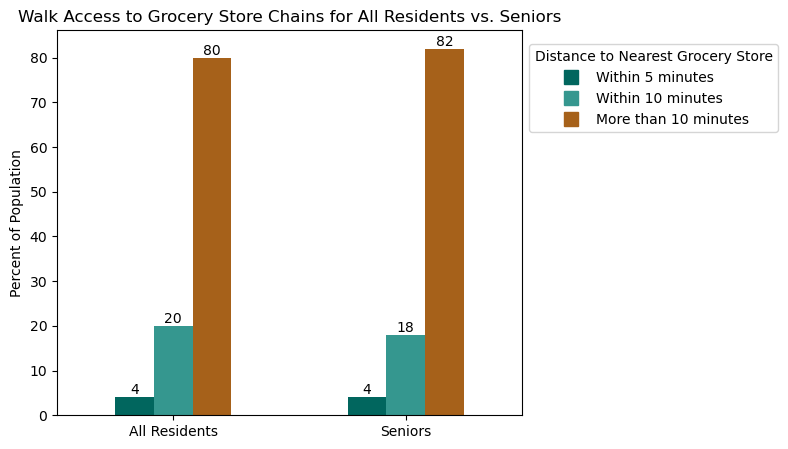

In [34]:
# Now I plot the pivot table.
fig, ax = plt.subplots(figsize=(6,5))

ax = grocery_table.plot(ax=ax, kind='bar',x='population', color=['#01665e','#35978f','#a6611a'] , legend=True)
ax.bar_label(ax.containers[0], label_type='edge')
ax.bar_label(ax.containers[1], label_type='edge')
ax.bar_label(ax.containers[2], label_type='edge')

# Adjust x-axis.
plt.xlabel(None)
plt.xticks(rotation=0)

# Ajust y-axis.
plt.ylabel("Percent of Population")

#Adjust table and legend.
plt.title("Walk Access to Grocery Store Chains for All Residents vs. Seniors")

# build custom legend
legend_elements = [(Line2D([0], [0], marker='s', color='#01665e', linestyle='',label='Within 5 minutes', markersize=10)),
                  (Line2D([0], [0], marker='s', color='#35978f', linestyle='',label='Within 10 minutes', markersize=10)),
                  (Line2D([0], [0], marker='s', color='#a6611a', linestyle='',label='More than 10 minutes', markersize=10))]
plt.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, .85), title='Distance to Nearest Grocery Store')

fig.set_facecolor((1, 1, 1, 0))
ax.set_facecolor("white")

plt.savefig('grocery_walkable_plot.png',bbox_inches="tight",transparent=True)
plt.show()

We can see from this chart that Seniors are more likely to live in a census block group that does not have a walkable grocery store (82% compared to 80%).

We also want to understand which neighborhoods have particularly low access for seniors, so we'll aggregate our data by neighborhood.

In [35]:
# Create a new dataframe with totals for each neighborhood that sums up all relevant columns.
grocery_by_neighborhood = senior_grocery.groupby(['neighborhood']).sum(numeric_only=True).reset_index()

# Recalculate percentages.
grocery_by_neighborhood['pct_snr_5_min']=(grocery_by_neighborhood['seniors_5_min']/grocery_by_neighborhood['Total Senior Pop'])
grocery_by_neighborhood['pct_snr_10_min']=(grocery_by_neighborhood['seniors_10_min']/grocery_by_neighborhood['Total Senior Pop'])
grocery_by_neighborhood['pct_snr_15_min']=(grocery_by_neighborhood['seniors_15_min']/grocery_by_neighborhood['Total Senior Pop'])
grocery_by_neighborhood['pct_snr_none']=(grocery_by_neighborhood['seniors_none']/grocery_by_neighborhood['Total Senior Pop'])

# Finally, we have to add back in the geometry column from the original neighborhood geodataframe.
grocery_by_neighborhood=pd.merge(neighborhoods[['neighborhood','geometry']],grocery_by_neighborhood,how="left", on=['neighborhood'])

# Keep just necessary columns.
grocery_by_neighborhood=grocery_by_neighborhood[['neighborhood','geometry','pct_snr_5_min','pct_snr_10_min','pct_snr_15_min','pct_snr_none']]

# Add in neighborhood colors for mapping.
for index, row in grocery_by_neighborhood.iterrows():
    if grocery_by_neighborhood.loc[index, 'pct_snr_10_min'] ==0:
        grocery_by_neighborhood.loc[index, 'colors'] = '#a6611a'
    elif grocery_by_neighborhood.loc[index, 'pct_snr_10_min'] < .10:
        grocery_by_neighborhood.loc[index, 'colors'] = '#dfc27d'
    elif grocery_by_neighborhood.loc[index, 'pct_snr_10_min'] < .25:
        grocery_by_neighborhood.loc[index, 'colors'] = '#80cdc1'
    elif grocery_by_neighborhood.loc[index, 'pct_snr_10_min'] < .50:
        grocery_by_neighborhood.loc[index, 'colors'] = '#35978f'
    elif grocery_by_neighborhood.loc[index, 'pct_snr_10_min'] <= 1:
        grocery_by_neighborhood.loc[index, 'colors'] = '#01665e'
    else:
        grocery_by_neighborhood.loc[index, 'colors'] = '#f7f7f5'

# See how this table looks.
grocery_by_neighborhood.sort_values('pct_snr_none',ascending=True).head(5)

,neighborhood,geometry,pct_snr_5_min,pct_snr_10_min,pct_snr_15_min,pct_snr_none,colors
52,Koreatown,"POLYGON ((1973426.406 562358.370, 1973427.701 ...",0.147267,0.544597,0.795689,0.455403,#01665e
49,Hollywood,"POLYGON ((1969734.109 567209.707, 1969839.499 ...",0.097670,0.457952,0.773800,0.542048,#35978f
43,Harvard Heights,"POLYGON ((1972240.553 560032.451, 1972223.927 ...",0.089863,0.456966,0.878488,0.543034,#35978f
106,Westlake,"POLYGON ((1976080.190 561472.084, 1976010.254 ...",0.083579,0.440776,0.897137,0.559224,#35978f
80,Sawtelle,"POLYGON ((1959009.539 560789.257, 1959806.166 ...",0.104077,0.399226,0.716128,0.600774,#35978f


Now we can visualize how access varies by block group _and_ neighborhood.

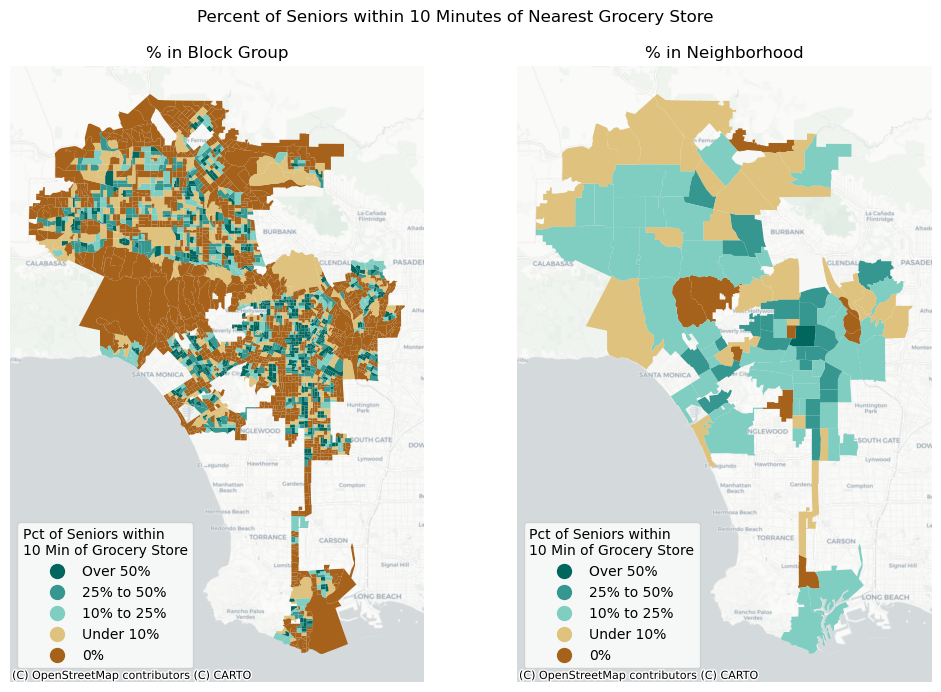

In [36]:
# Map all three subplots.
fig, ax = plt.subplots(1, 2, figsize=(12, 8))

senior_grocery.plot(ax=ax[0],color=senior_grocery['colors'])
ax[0].axis("off")
ax[0].set_title("% in Block Group")
ctx.add_basemap(ax=ax[0], source=ctx.providers.CartoDB.Positron, crs='epsg:6423')

# spatial lag map on the right
grocery_by_neighborhood.plot(ax=ax[1],color=grocery_by_neighborhood['colors'])
ax[1].axis("off")
ax[1].set_title("% in Neighborhood")
ctx.add_basemap(ax=ax[1], source=ctx.providers.CartoDB.Positron, crs='epsg:6423')

# build custom legend
legend_elements = [(Line2D([0], [0], marker='o', color='#01665e', linestyle='',label='Over 50%', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#35978f', linestyle='',label='25% to 50%', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#80cdc1', linestyle='',label='10% to 25%', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#dfc27d', linestyle='',label='Under 10%', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#a6611a', linestyle='',label='0%', markersize=10))]

ax[0].legend(handles=legend_elements,loc='lower left', bbox_to_anchor=(0,.011), title="Pct of Seniors within \n10 Min of Grocery Store")
ax[1].legend(handles=legend_elements,loc='lower left', bbox_to_anchor=(0,.011), title="Pct of Seniors within \n10 Min of Grocery Store")
fig.suptitle('Percent of Seniors within 10 Minutes of Nearest Grocery Store',x=0.5,y=.95)
plt.savefig('grocery_walkable_map.png',bbox_inches="tight",transparent=True)
plt.show()

### Part 4: What is the distribution of public transit like in LA? 
In this section, we will look at density of transit stops in the city of Los Angeles, and how that relates to where senior residents are living. We aim to identify whether/where there areas where there are high numbers of senior residents, and comparatively low density of transit options.

First we import data on neighborhood boundaries, transit stop locations, transity stop density, and senior population. The transit stop density and location files are compilations of data developed for the midterm, and saved as files for future use.

In [37]:
# Reset senior basemap.
seniors = gpd.read_file('data/Seniors_Basemap.geojson')

In [38]:
#read in transit stop data and create dataframes

#Spatial data for public transit stops in City of LA
transit_stops = gpd.read_file('data/transit_stops.geojson')
#Information on number of public transit stops per 
transit_density = pd.read_csv('data/transit_stopcount.csv')
lowtransitdensebg = gpd.read_file('data/lowdensityblockgroups.geojson')
hightransitdensebg= gpd.read_file('data/highdensityblockgroups.geojson')

#read in LA Times Neighborhood Boundaries 
neighborhoods = gpd.read_file('data/LA_Times_Neighborhood_Boundaries.geojson')

### Map of Transit Stop Locations and Senior Density

First, we look at where public transit stops are located in LA, and how that compares to where seniors are most densely located.

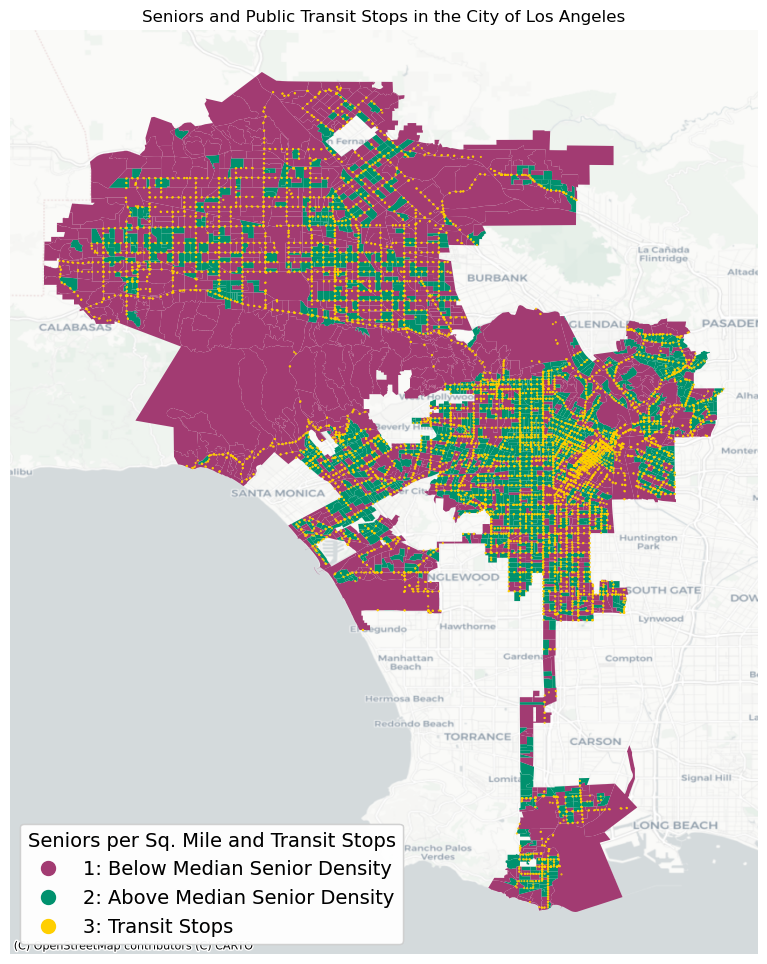

In [39]:
# I am going to have to create a manual legend since I have multiple layers, so I will first create a color dictionary.
color_dict = {'1: Below Median Senior Density': '#A23B72',
 '2: Above Median Senior Density': '#00916E',
 '3: Transit Stops': '#FFCF00'}

# Now I create a "colors" column in each separate dataframe that denotes the color I want things to show up as.

seniors.loc[seniors["Pop Density"] < 135.000000, "colors"]= '#A23B72' 
seniors.loc[seniors["Pop Density"] >= 135.000000, "colors"]= '#00916E' 
transit_stops["colors"] = '#FFCF00'

#Plot Bus Stops and Metro Stops on top of Senior Population Density
fig,ax = plt.subplots(figsize=(12,12))
ax1=seniors.plot(ax=ax,zorder=1,color=seniors['colors'])

#plot LA metro bus stops
ax2=transit_stops.plot(ax=ax, zorder=2, marker='.',markersize=1,legend=True,color=transit_stops['colors'])
                                                                                                
# Add manual legend.
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=10, color=color) for color in color_dict.values()]
leg_points = ax.legend(custom_points, color_dict.keys(), title="Seniors per Sq. Mile and Transit Stops",fontsize = 14)
leg_points.get_title().set_fontsize('14') 
ax.add_artist(leg_points)


#Format plot.
ax.axis('off')
ax.set_title('Seniors and Public Transit Stops in the City of Los Angeles')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=4326)
plt.savefig('Seniors and Public Transit Stops.png')

### Map of Density of Transit Stops

Next, we look at density of transit stops to get a better spatial metric. The following map shows block groups in the top and bottom quartiles (highest and lowest) of transit stops/block group. This can help provide a visual of areas that might be good to focus in on for futher analysis.

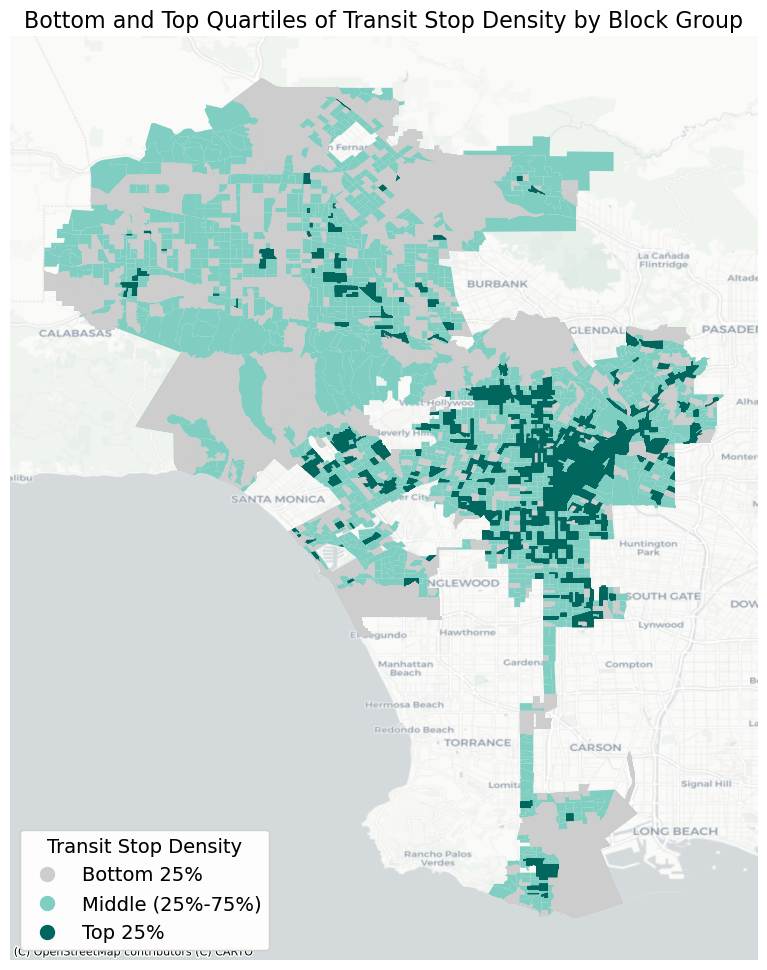

In [40]:
# Add manual legend
color_dict = {'Bottom 25%': '#CDCDCD',
'Middle (25%-75%)': '#80cdc1',
              'Top 25%': '#01665e',
           }

# Now I create a "colors" column in each separate dataframe that denotes the color I want things to show up as.
lowtransitdensebg["colors"] = '#CDCDCD'
hightransitdensebg["colors"] = '#01665e'
seniors["colors1"] = '#80cdc1'

# Now I create my actual map with the three geodataframes added in the appropriate order (zorder).
fig,ax = plt.subplots(figsize=(12,12))
lowtransitdensebg.plot(ax=ax, zorder=3, color=lowtransitdensebg['colors'])
hightransitdensebg.plot(ax=ax, zorder=2, color=hightransitdensebg['colors'])
ax1=seniors.plot(ax=ax,zorder=1,color=seniors['colors1'])

# Add manual legend.
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=10, color=color) for color in color_dict.values()]
leg_points = ax.legend(custom_points, color_dict.keys(),loc='lower left', title="Transit Stop Density", fontsize = 14)
leg_points.get_title().set_fontsize('14') 
ax.add_artist(leg_points)

#Format plot.
ax.axis('off')
ax.set_title('Bottom and Top Quartiles of Transit Stop Density by Block Group',fontsize = 16)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=4326)
plt.savefig('Transitstopdensty.png')

### Scaling Up to Neighborhoods

Since we hope to pick several neighborhoods to focus in on for more analysis, it is helpful to connect this information to neighborhood boundaries.

We will join the transit_stops geodataframe to the LA neighborhood boundaries.

In [41]:
#spatial join of transit stop locations and neighborhood boundaries
transit_stops_nbrhood = gpd.sjoin(transit_stops, neighborhoods)
#display
transit_stops_nbrhood.sample(1)

,stopid,stopname,geometry,colors,index_right,OBJECTID,name
564,305782,Griffin & Broadway,POINT (-118.21166 34.07396),#FFCF00,56,57,Lincoln Heights


In [42]:
#Use valuecounts to get the number of unique stops per neighborhood
transit_nbrhood_count= transit_stops_nbrhood.value_counts(['name']).reset_index(name='stop_count')
#display statistics 
transit_nbrhood_count.describe()

,stop_count
count,113.000000
mean,90.398230
std,94.149533
min,2.000000
25%,37.000000
50%,71.000000
75%,117.000000
max,850.000000


In [43]:
#Create dataframe of lowest quartile of # of transit stops/neighborhood.
low25_nbhd = transit_nbrhood_count[transit_nbrhood_count["stop_count"] < 37.000000]
#rename columns for plotting
low25_nbhd = low25_nbhd.rename(columns={'stop_count': 'Number of Public Transit Stops', 'name': 'Neighborhood'})

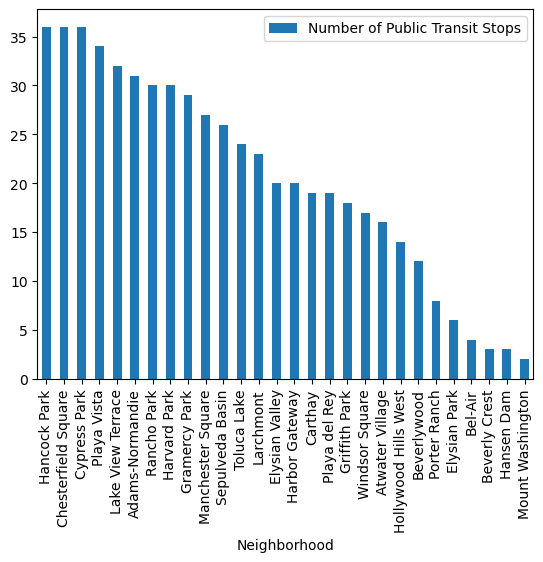

In [44]:
#Plot bar graph
ax = low25_nbhd.plot.bar(x='Neighborhood', y='Number of Public Transit Stops', rot=90)

Calculate transit stops per square mile at the neighborhood level.

In [45]:
# Open file with square milage of neighborhoods.
neighborhood_geometries=gpd.read_file('neighborhood_geometries.geojson')

# Join areas to transit counts.
transit_nbrhood_count=transit_nbrhood_count.rename(columns={'name':'neighborhood'})
transit_nbrhood_count=pd.merge(transit_nbrhood_count,neighborhood_geometries,how='left',on=['neighborhood'])
transit_nbrhood_count['stop_density']=transit_nbrhood_count['stop_count']/transit_nbrhood_count['official_area']
transit_nbrhood_count=transit_nbrhood_count.sort_values('stop_density')

In [46]:
transit_nbrhood_count

,neighborhood,stop_count,Total_Pop,pop_density,official_area,geometry,stop_density
110,Beverly Crest,3,9090.0,1197.102369,7.593336,"POLYGON ((1960395.368 564333.137, 1960377.757 ...",0.395083
109,Bel-Air,4,6541.0,978.507432,6.684671,"POLYGON ((1957417.275 570066.780, 1957497.855 ...",0.598384
112,Mount Washington,2,14105.0,7302.361756,1.931567,"POLYGON ((1980297.466 568381.216, 1980434.940 ...",1.035429
111,Hansen Dam,3,47.0,17.693301,2.656373,"POLYGON ((1966662.713 585830.496, 1966752.092 ...",1.129360
107,Porter Ranch,8,23391.0,4321.605184,5.412572,"POLYGON ((1951231.687 584128.810, 1948539.963 ...",1.478040
...,...,...,...,...,...,...,...
69,Century City,50,4325.0,7003.359290,0.617561,"POLYGON ((1961903.496 562278.062, 1961944.660 ...",80.963691
6,Historic South-Central,225,52627.0,19986.990218,2.633063,"POLYGON ((1975457.526 558986.808, 1975655.610 ...",85.451817
2,Koreatown,243,102025.0,37095.187629,2.750357,"POLYGON ((1973426.406 562358.370, 1973427.701 ...",88.352174
3,Westlake,242,111033.0,41309.505202,2.687832,"POLYGON ((1976080.190 561472.084, 1976010.254 ...",90.035397


In [47]:
#merge to neighborhoods data to get the geometry column back
transit_nbrhood_count=pd.merge(neighborhood_geometries,transit_nbrhood_count,how="left", 
                              on=['neighborhood'])

In [48]:
transit_nbrhood_count.head()

,neighborhood,Total_Pop_x,pop_density_x,official_area_x,geometry_x,stop_count,Total_Pop_y,pop_density_y,official_area_y,geometry_y,stop_density
0,Adams-Normandie,17200.0,21888.043426,0.785817,"POLYGON ((1972233.388 559643.685, 1971938.035 ...",31.0,17200.0,21888.043426,0.785817,"POLYGON ((1972233.388 559643.685, 1971938.035 ...",39.449381
1,Arleta,35362.0,11762.758591,3.006268,"POLYGON ((1959244.309 584850.051, 1959257.540 ...",53.0,35362.0,11762.758591,3.006268,"POLYGON ((1959244.309 584850.051, 1959257.540 ...",17.629834
2,Arlington Heights,18049.0,19405.882043,0.930079,"POLYGON ((1970582.552 561395.372, 1970757.410 ...",52.0,18049.0,19405.882043,0.930079,"POLYGON ((1970582.552 561395.372, 1970757.410 ...",55.909240
3,Atwater Village,12741.0,8257.667583,1.542930,"MULTIPOLYGON (((1974284.934 572493.221, 197428...",16.0,12741.0,8257.667583,1.542930,"MULTIPOLYGON (((1974284.934 572493.221, 197428...",10.369883
4,Baldwin Hills/Crenshaw,31450.0,11385.807062,2.762211,"POLYGON ((1966656.952 558331.179, 1966727.113 ...",103.0,31450.0,11385.807062,2.762211,"POLYGON ((1966656.952 558331.179, 1966727.113 ...",37.288971


In [49]:
#sort for lowest density neighborhoods
transit_nbrhood_count=transit_nbrhood_count.sort_values(by=['stop_density'],ascending=False)
#rename columns for plotting
transit_nbrhood_count = transit_nbrhood_count.rename(columns={'stop_density': 'Density of Public Transit Stops', 'neighborhood': 'Neighborhood'})

In [50]:
#how many rows are there?
transit_nbrhood_count.shape[0]

114

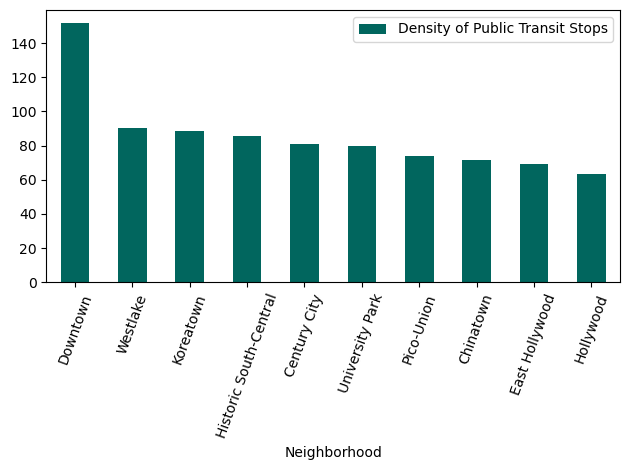

In [51]:
#Plot bar graph
ax1 = transit_nbrhood_count.iloc[0:10].plot.bar(x='Neighborhood', y='Density of Public Transit Stops', rot=70, color = '#01665e')
plt.tight_layout()
plt.savefig('Transitstopdenstybarchart.png')

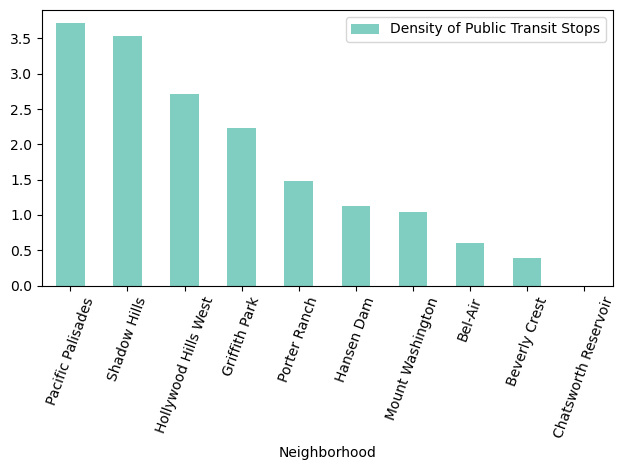

In [52]:
#Plot bar graph
ax2 = transit_nbrhood_count.iloc[104:114].plot.bar(x='Neighborhood', y='Density of Public Transit Stops', rot=70, color = '#80cdc1')
plt.tight_layout()
plt.savefig('Transitstopdenstybarchartlow.png', bbox_inches='tight')

In [53]:
transit_nbrhood_count.head()

,Neighborhood,Total_Pop_x,pop_density_x,official_area_x,geometry_x,stop_count,Total_Pop_y,pop_density_y,official_area_y,geometry_y,Density of Public Transit Stops
23,Downtown,55454.0,9902.213119,5.600162,"POLYGON ((1977428.597 562291.401, 1977496.560 ...",850.0,55454.0,9902.213119,5.600162,"POLYGON ((1977428.597 562291.401, 1977496.560 ...",151.781317
108,Westlake,111033.0,41309.505202,2.687832,"POLYGON ((1976080.190 561472.084, 1976010.254 ...",242.0,111033.0,41309.505202,2.687832,"POLYGON ((1976080.190 561472.084, 1976010.254 ...",90.035397
52,Koreatown,102025.0,37095.187629,2.750357,"POLYGON ((1973426.406 562358.370, 1973427.701 ...",243.0,102025.0,37095.187629,2.750357,"POLYGON ((1973426.406 562358.370, 1973427.701 ...",88.352174
46,Historic South-Central,52627.0,19986.990218,2.633063,"POLYGON ((1975457.526 558986.808, 1975655.610 ...",225.0,52627.0,19986.990218,2.633063,"POLYGON ((1975457.526 558986.808, 1975655.610 ...",85.451817
15,Century City,4325.0,7003.359290,0.617561,"POLYGON ((1961903.496 562278.062, 1961944.660 ...",50.0,4325.0,7003.359290,0.617561,"POLYGON ((1961903.496 562278.062, 1961944.660 ...",80.963691


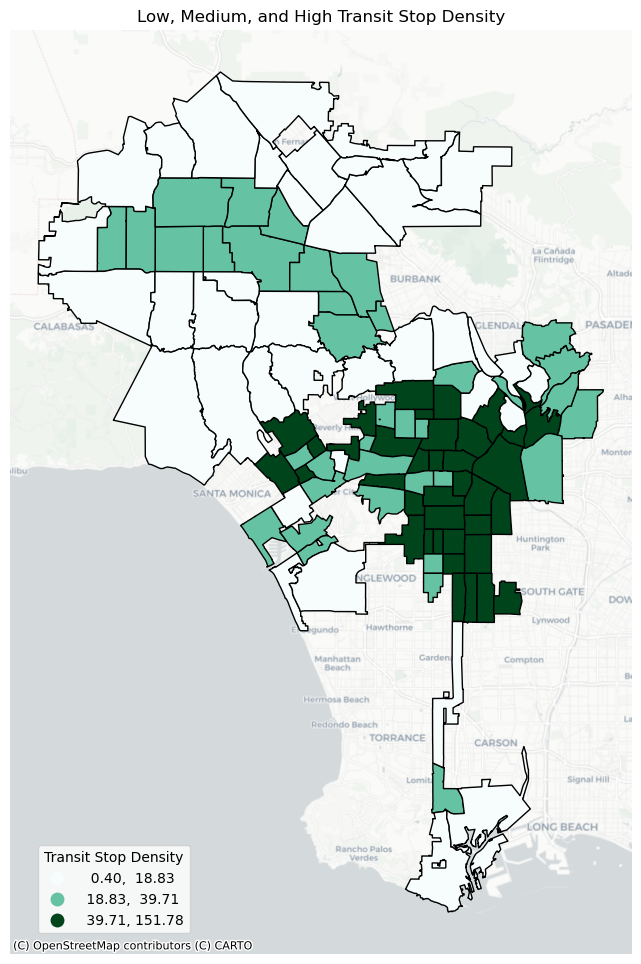

In [54]:
transit_nbrhood_count = transit_nbrhood_count.set_geometry("geometry_x")

#plot map
fig, ax = plt.subplots(figsize=(12,12))
transit_nbrhood_count.plot(ax=ax, 
                  column='Density of Public Transit Stops',
                           scheme='quantiles',
                           k=3,
                           cmap='BuGn',
                  edgecolor='k',
                          legend = True)
leg = ax.get_legend()
leg.set_bbox_to_anchor((0.3,0.125))
leg.set_title('Transit Stop Density')
ax.set_title('Low, Medium, and High Transit Stop Density')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs='epsg:6423')
ax.axis('off');
fig.savefig('neighborhood transit stop density', bbox_inches='tight')

### Part 5: Identifying Areas with Largest Gaps in Access to Grocery Stores

#### Neighborhood Prioritization
To calculate priority scores for each neighborhood, we first created a dataframe with the relevant key variables from each prior section:
1. Percentage of residents who are seniors
2. Percentage of senior-headed households that do not have access to a vehicle
3. Percentage of seniors who live more than 10 minutes from a grocery store
4. Number of transit stops per square mile<br>

To be able to combine different data with different units and distributions into a single index, we will convert all four variables to percentiles and then average them. 

In [55]:
# Pull out just variables key to index calculations.
senior_index=neighborhood_seniors[['neighborhood','geometry','Pct Seniors']]
venicle_index=vehicles_by_neighborhood[['neighborhood','Pct Senior-Headed Households Without a Vehicle']]
grocery_index=grocery_by_neighborhood[['neighborhood','pct_snr_none']]
transit_nbrhood_count = transit_nbrhood_count.rename(columns={'Density of Public Transit Stops':'stop_density', 'Neighborhood':'neighborhood'})
transit_index=transit_nbrhood_count[['neighborhood','stop_density']]

# Merge into one dataframe.
neighborhood_priority=pd.merge(senior_index,venicle_index,on=['neighborhood'],how='left')
neighborhood_priority=pd.merge(neighborhood_priority,grocery_index,on=['neighborhood'],how='left')
neighborhood_priority=pd.merge(neighborhood_priority,transit_index,on=['neighborhood'],how='left')
neighborhood_priority=pd.merge(neighborhood_priority,neighborhood_geometries[['neighborhood','pop_density']],on=['neighborhood'],how='left')

# Drop places that aren't urban neighborhoods.
neighborhood_priority=neighborhood_priority[neighborhood_priority['pop_density']>950]

# Calculate percentiles.
neighborhood_priority['Senior_Percentile']=(neighborhood_priority['Pct Seniors'].rank())/(max(neighborhood_priority['Pct Seniors'].rank()))*100
neighborhood_priority['Vehicle_Percentile']=(neighborhood_priority['Pct Senior-Headed Households Without a Vehicle'].rank())/(max(neighborhood_priority['Pct Senior-Headed Households Without a Vehicle'].rank()))*100
neighborhood_priority['Grocery_Percentile']=(neighborhood_priority['pct_snr_none'].rank())/(max(neighborhood_priority['pct_snr_none'].rank()))*100
neighborhood_priority['Stop_Percentile']=(neighborhood_priority['stop_density'].rank(ascending=False))/(max(neighborhood_priority['stop_density'].rank(ascending=False)))*100

# Average scores across variables. 
neighborhood_priority['Priority_Index']=(neighborhood_priority['Senior_Percentile']+neighborhood_priority['Vehicle_Percentile']+neighborhood_priority['Grocery_Percentile']+neighborhood_priority['Stop_Percentile'])/4

# Get top 10. 
neighborhood_priority=neighborhood_priority.sort_values(by=['Priority_Index'],ascending=False)
neighborhood_priority.iloc[0:10]

,neighborhood,geometry,Pct Seniors,Pct Senior-Headed Households Without a Vehicle,pct_snr_none,stop_density,pop_density,Senior_Percentile,Vehicle_Percentile,Grocery_Percentile,Stop_Percentile,Priority_Index
3,Beverly Crest,"POLYGON ((-118.42910 34.07920, -118.42929 34.0...",24.1,6.388013,1.000000,0.395083,1197.102369,98.165138,9.174312,100.000000,100.000000,76.834862
14,Tujunga,"POLYGON ((-118.26682 34.23068, -118.26882 34.2...",19.6,20.185529,0.863440,4.414975,2434.674615,88.532110,66.055046,60.000000,92.660550,76.811927
2,Bel-Air,"POLYGON ((-118.46165 34.13077, -118.46077 34.1...",28.7,6.081081,1.000000,0.598384,978.507432,99.082569,8.256881,100.000000,99.082569,76.605505
20,Lake View Terrace,"POLYGON ((-118.38741 34.29824, -118.38740 34.2...",18.6,12.327586,1.000000,8.280776,3808.639360,82.568807,33.027523,100.000000,87.155963,75.688073
18,West Hills,"POLYGON ((-118.60375 34.23324, -118.60300 34.2...",18.8,13.742690,0.917620,10.040071,4875.781518,84.403670,40.366972,77.142857,86.238532,72.038008
15,Tarzana,"POLYGON ((-118.52729 34.17083, -118.52724 34.1...",19.5,15.668413,0.881295,6.392874,4203.370552,87.155963,45.871560,62.857143,90.825688,71.677588
17,Shadow Hills,"MULTIPOLYGON (((-118.27059 34.23274, -118.2698...",18.9,7.183212,0.999639,3.539054,1138.369042,85.321101,11.009174,94.285714,95.412844,71.507208
6,Porter Ranch,"POLYGON ((-118.52951 34.25727, -118.55873 34.2...",22.0,3.228200,0.950283,1.478040,4321.605184,95.412844,1.834862,87.619048,97.247706,70.528615
21,Hollywood Hills West,"POLYGON ((-118.36956 34.12922, -118.36952 34.1...",18.5,8.972912,0.931009,2.712977,2979.235795,81.651376,19.266055,80.952381,96.330275,69.550022
25,Sunland,"POLYGON ((-118.29941 34.27623, -118.29954 34.2...",17.4,16.346154,0.905334,13.887374,5903.869963,77.981651,47.706422,71.428571,79.816514,69.233290


In [56]:
def priorityplt(num):
    fig,ax = plt.subplots(figsize=(8,8))
    micro.plot(ax=ax,color='grey',alpha=.5,edgecolor='black',lw=1)
    neighborhood_priority.iloc[0:num].plot(ax=ax,color='#01665e',edgecolor='#80cdc1',lw=1)
    ax.axis('off')
    ax.set_title('Top '+str(num)+' Highest Scoring Neighborhoods')
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=4326)

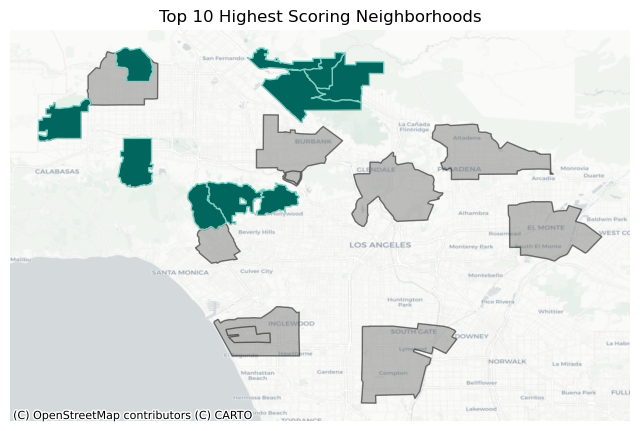

In [57]:
priorityplt(10)

Many of the areas identified in the above priority index are dominated by greenspace/parks rather than residents, so we wanted to only include urban areas, which are defined by the census as areas with at least 1000 people per square mile. 

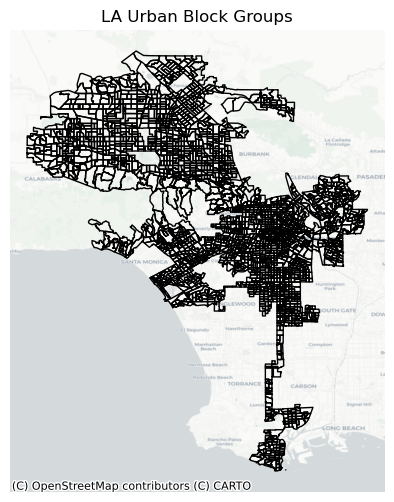

In [58]:
#Read in information on population density per square mile
pop_density = bg_geometries.rename(columns={'pop_density':'Total Pop Density'}).to_crs(crs=4326)

#create dataframe of urban areas (at least 1000 people per square mile)
urban = pop_density.loc[pop_density['Total Pop Density']>1000]

#Plot urban areas
fig, ax = plt.subplots(figsize=(5,6))
urban.plot(ax=ax, 
        color='none', 
          edgecolor = 'k',
          linewidth = 1)

# turn the axes off
ax.axis('off')

# give it a title
ax.set_title('LA Urban Block Groups')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=4326)

Next we joined our neighborhood priority index with urban block groups to discard non-urban block groups.

In [59]:
# join of dataframes
neighborhood_priority_urban = pd.merge(urban,neighborhood_priority,how='left',on=['neighborhood'])
#display joined dataframe
neighborhood_priority_urban.head(5)

,BG20,Total_Pop,Total Pop Density,official_area,neighborhood,geometry_x,geometry_y,Pct Seniors,Pct Senior-Headed Households Without a Vehicle,pct_snr_none,stop_density,pop_density,Senior_Percentile,Vehicle_Percentile,Grocery_Percentile,Stop_Percentile,Priority_Index
0,9800171,1075.0,1162.828,0.022800,Brentwood,"MULTIPOLYGON (((-118.46673 34.06771, -118.4653...","POLYGON ((-118.49014 34.13096, -118.49009 34.1...",19.6,8.482359,0.861970,6.879413,2507.106907,88.532110,14.678899,59.047619,88.990826,62.812363
1,3201022,1934.0,5660.926,0.003002,Pacoima,"MULTIPOLYGON (((-118.42347 34.29632, -118.4214...","POLYGON ((-118.41131 34.28981, -118.40915 34.2...",11.2,18.124698,0.757868,18.668854,11597.951685,26.605505,55.963303,25.714286,69.724771,44.501966
2,3017024,1079.0,9679.230,0.005682,Atwater Village,"POLYGON ((-118.27557 34.15317, -118.27556 34.1...","MULTIPOLYGON (((-118.27886 34.15321, -118.2788...",18.7,10.439105,0.907675,10.369883,8257.667583,83.486239,25.688073,72.380952,85.321101,66.719091
3,2976023,1148.0,13965.220,0.082204,San Pedro,"POLYGON ((-118.29162 33.71970, -118.29162 33.7...","MULTIPOLYGON (((-118.28845 33.75438, -118.2885...",15.7,16.441659,0.832631,15.401642,5669.624442,67.889908,49.541284,47.619048,76.146789,60.299257
4,2976022,1241.0,11796.650,0.105199,San Pedro,"POLYGON ((-118.29162 33.71516, -118.29065 33.7...","MULTIPOLYGON (((-118.28845 33.75438, -118.2885...",15.7,16.441659,0.832631,15.401642,5669.624442,67.889908,49.541284,47.619048,76.146789,60.299257


Now we have a dataframe with only urban areas, but we need to condense block group infomation to the neighborhood level.

<AxesSubplot: >

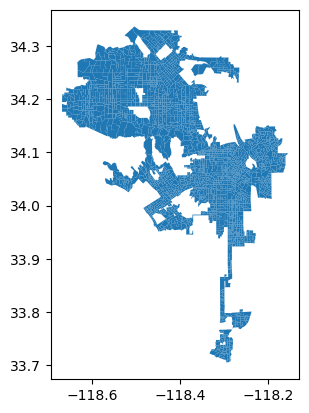

In [60]:
neighborhood_priority_urban=neighborhood_priority_urban.set_geometry('geometry_x')
neighborhood_priority_urban.plot()

In [61]:
#use dissolve function to get neighborhood level dataset 
neighborhood_priority_urban = neighborhood_priority_urban.dissolve(by='neighborhood', aggfunc='mean').reset_index()
#sort new dataset by index ranking
neighborhood_priority_urban=neighborhood_priority_urban.sort_values(by=['Priority_Index'],ascending=False)

#look at top 10 priority neighboorhoods
neighborhood_priority_urban.iloc[0:10]

/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1676: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,neighborhood,geometry_x,Total_Pop,Total Pop Density,official_area,Pct Seniors,Pct Senior-Headed Households Without a Vehicle,pct_snr_none,stop_density,pop_density,Senior_Percentile,Vehicle_Percentile,Grocery_Percentile,Stop_Percentile,Priority_Index
6,Beverly Crest,"POLYGON ((-118.44130 34.13097, -118.44101 34.1...",1729.750000,1499.157250,1.234811,24.1,6.388013,1.000000,0.395083,1197.102369,98.165138,9.174312,100.000000,100.000000,76.834862
88,Tujunga,"POLYGON ((-118.28968 34.24908, -118.28983 34.2...",1482.529412,10717.835765,0.204879,19.6,20.185529,0.863440,4.414975,2434.674615,88.532110,66.055046,60.000000,92.660550,76.811927
5,Bel-Air,"POLYGON ((-118.45966 34.08419, -118.45967 34.0...",1409.000000,1358.543333,1.102773,28.7,6.081081,1.000000,0.598384,978.507432,99.082569,8.256881,100.000000,99.082569,76.605505
50,Lake View Terrace,"POLYGON ((-118.37018 34.28190, -118.36988 34.2...",1962.857143,7230.187571,0.548979,18.6,12.327586,1.000000,8.280776,3808.639360,82.568807,33.027523,100.000000,87.155963,75.688073
100,West Hills,"POLYGON ((-118.66144 34.18950, -118.66131 34.1...",1656.120000,5974.801360,0.332780,18.8,13.742690,0.917620,10.040071,4875.781518,84.403670,40.366972,77.142857,86.238532,72.038008
86,Tarzana,"POLYGON ((-118.54312 34.12704, -118.54370 34.1...",1499.120000,12539.501680,0.356647,19.5,15.668413,0.881295,6.392874,4203.370552,87.155963,45.871560,62.857143,90.825688,71.677588
78,Shadow Hills,"MULTIPOLYGON (((-118.34419 34.21410, -118.3441...",1922.400000,4105.078600,0.693979,18.9,7.183212,0.999639,3.539054,1138.369042,85.321101,11.009174,94.285714,95.412844,71.507208
73,Porter Ranch,"POLYGON ((-118.55787 34.25926, -118.55781 34.2...",1375.941176,4577.428353,0.318387,22.0,3.228200,0.950283,1.478040,4321.605184,95.412844,1.834862,87.619048,97.247706,70.528615
45,Hollywood Hills West,"POLYGON ((-118.39468 34.09677, -118.39256 34.0...",1182.615385,4018.487385,0.396953,18.5,8.972912,0.931009,2.712977,2979.235795,81.651376,19.266055,80.952381,96.330275,69.550022
84,Sunland,"POLYGON ((-118.30706 34.25240, -118.30760 34.2...",1308.076923,8514.623000,0.221563,17.4,16.346154,0.905334,13.887374,5903.869963,77.981651,47.706422,71.428571,79.816514,69.233290


In [62]:
#plot
def priorityplturban(num):
    fig,ax = plt.subplots(figsize=(8,8))
    micro.plot(ax=ax,color='grey',alpha=.5,edgecolor='black',lw=1)
    neighborhood_priority_urban.iloc[0:num].plot(ax=ax,color='#01665e',edgecolor='#80cdc1',lw=1)
    ax.axis('off')
    ax.set_title('Top '+str(num)+' Highest Scoring Neighborhoods')
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=4326)

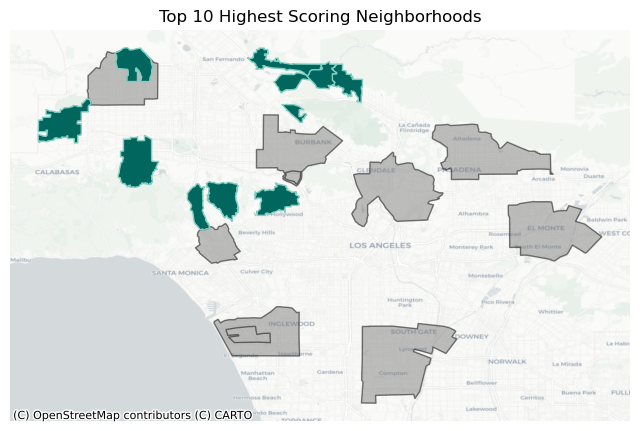

In [63]:
priorityplturban(10)

#### Block-Group Prioritization

To calculate priority scores for each block group, we first created a dataframe with the relevant key variables from each prior section:
1. Percentage of residents who are seniors
2. Percentage of senior-headed households that do not have access to a vehicle
3. Percentage of seniors who live more than 10 minutes from a grocery store
4. Number of transit stops per square mile<br>

In [64]:
# Prep senior population for merge.
seniors_index = gpd.read_file('seniors_update.geojson')
seniors_index=seniors_index[['BG20','geometry','Neighborhood','Total Senior Pop','Pct Seniors']]
seniors_index['BG20']=seniors_index['BG20'].astype(str)

# Prep vehicle access for merge.
vehicle_index=gpd.read_file('vehicle_access.geojson')
vehicle_index=vehicle_index[['BG20','Pct Senior-Headed Households Without a Vehicle']]

# Prep grocery store access for merge.
grocery_index=senior_grocery[['BG20','pct_none']]
grocery_index['pct_none']=grocery_index['pct_none']*100

# Prep transit stop density for merge.
transit_index=pd.read_csv('data/transit_stopcount.csv')
transit_index=transit_index[['BG20','stop_count']]
transit_index['BG20']=transit_index['BG20'].astype(str)

# Merge all four variables together. 
bg_priority=pd.merge(seniors_index,vehicle_index,how='left',on=['BG20'])
bg_priority=pd.merge(bg_priority,grocery_index,how='left',on=['BG20'])
bg_priority=pd.merge(bg_priority,transit_index,how='left',on=['BG20'])
bg_priority=pd.merge(bg_priority,bg_geometries[['BG20','pop_density','official_area']],how='left',on=['BG20'])
bg_priority['stop_count']=bg_priority['stop_count'].fillna(0)
bg_priority['stopdensity']=bg_priority['stop_count']/bg_priority['official_area']
bg_priority.head(3)

/tmp/ipykernel_1460/1000684384.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,BG20,geometry,Neighborhood,Total Senior Pop,Pct Seniors,Pct Senior-Headed Households Without a Vehicle,pct_none,stop_count,pop_density,official_area,stopdensity
0,1233043,"POLYGON ((1962721.911 577050.650, 1962848.921 ...",Valley Glen,609,62.718847,71.167048,100.000000,1.0,21426.74,0.045317,22.066677
1,2075021,"POLYGON ((1976779.208 561139.329, 1976836.914 ...",Downtown,761,62.377049,84.331797,100.000000,8.0,49546.61,0.024623,324.895788
2,2012001,"POLYGON ((1983048.304 565141.395, 1983111.207 ...",El Sereno,417,57.517241,15.492958,45.367482,6.0,16396.35,0.170221,35.248323


Following the previous neighborhood-level analysis, we are only interested in "urban" block groups (those with at leats 1,000 people per square mile).

In [65]:
# Filter for just urban block groups.
bg_priority=bg_priority[bg_priority['pop_density']>1000]

# Check that this worked by looking at rows with the lowest population density.
bg_priority.sort_values('pop_density').head(3)

,BG20,geometry,Neighborhood,Total Senior Pop,Pct Seniors,Pct Senior-Headed Households Without a Vehicle,pct_none,stop_count,pop_density,official_area,stopdensity
800,1066031,"POLYGON ((1951758.718 591298.304, 1951903.610 ...",Granada Hills,289,17.212627,4.000000,100.0,2.0,1001.894,1.675826,1.193441
2333,2774001,"POLYGON ((1965014.217 549653.104, 1965015.304 ...",Westchester,6,5.607477,0.000000,100.0,3.0,1018.916,0.105014,28.567725
186,2612002,"POLYGON ((1959071.515 567944.476, 1959229.475 ...",Beverly Crest,386,27.749820,9.230769,100.0,0.0,1053.269,1.320651,0.000000


To be able to combine different data with different units and distributions into a single index, we will convert all four variables to percentiles and then average them. 

In [66]:
# Calculate percentiles.
bg_priority['Senior_Percentile']=(bg_priority['Pct Seniors'].rank())/(max(bg_priority['Pct Seniors'].rank()))*100
bg_priority['Vehicle_Percentile']=(bg_priority['Pct Senior-Headed Households Without a Vehicle'].rank())/(max(bg_priority['Pct Senior-Headed Households Without a Vehicle'].rank()))*100
bg_priority['Grocery_Percentile']=(bg_priority['pct_none'].rank())/(max(bg_priority['pct_none'].rank()))*100
bg_priority['Stop_Percentile']=(bg_priority['stopdensity'].rank(ascending=False))/(max(bg_priority['stopdensity'].rank(ascending=False)))*100

# Average percentiles for available data.
bg_priority['Priority_Percentile']=(bg_priority['Senior_Percentile']+bg_priority['Vehicle_Percentile']+bg_priority['Grocery_Percentile']+bg_priority['Stop_Percentile'])/4
bg_priority.loc[bg_priority['Pct Senior-Headed Households Without a Vehicle'].isna(), 'Priority_Percentile'] = (bg_priority['Senior_Percentile']+bg_priority['Grocery_Percentile']+bg_priority['Stop_Percentile'])/3

bg_priority.sample(3)

,BG20,geometry,Neighborhood,Total Senior Pop,Pct Seniors,Pct Senior-Headed Households Without a Vehicle,pct_none,stop_count,pop_density,official_area,stopdensity,Senior_Percentile,Vehicle_Percentile,Grocery_Percentile,Stop_Percentile,Priority_Percentile
1406,1236011,"POLYGON ((1961153.195 576250.681, 1961253.762 ...",Valley Glen,108,11.829135,20.879121,82.839706,1.0,14600.180,0.062533,15.991430,48.322148,64.866412,45.158220,74.062122,58.102226
31,2626044,"POLYGON ((1950234.025 561194.239, 1950235.160 ...",Pacific Palisades,193,40.546218,24.000000,100.000000,1.0,3223.088,0.147684,6.771193,98.918717,68.301527,100.000000,88.221057,88.860325
83,1351162,"POLYGON ((1944819.148 576509.820, 1944842.769 ...",Woodland Hills,269,33.292079,44.497608,68.257597,4.0,14053.050,0.057496,69.569567,97.091723,85.648855,33.975732,16.417910,58.283555


Now we'll create a map of the bottom and top 20% of block groups to see how our priority index is distributed throughout the City of Los Angeles.

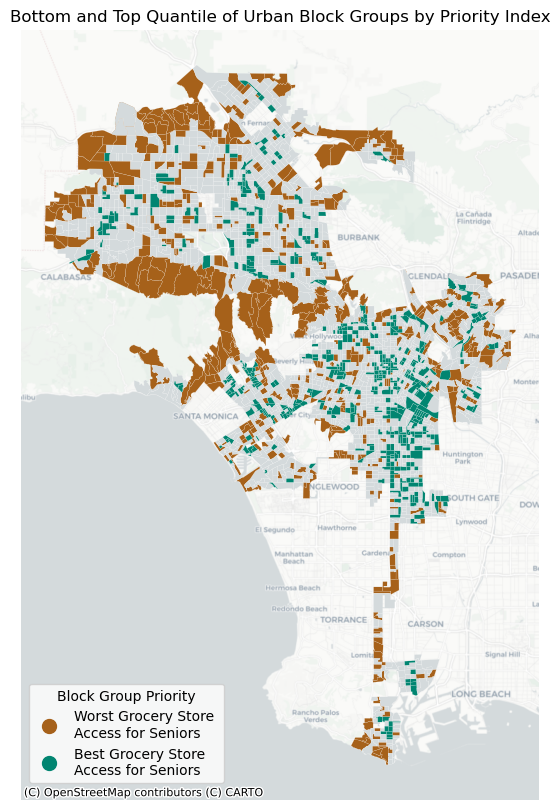

In [67]:
# Add in colors based on average priority percentile.
for index, row in bg_priority.iterrows():
    if bg_priority.loc[index, 'Priority_Percentile'] < (np.percentile(bg_priority['Priority_Percentile'], 20)):
        bg_priority.loc[index, 'colors'] = '#018571'
    elif bg_priority.loc[index, 'Priority_Percentile'] > (np.percentile(bg_priority['Priority_Percentile'], 80)):
        bg_priority.loc[index, 'colors'] = '#a6611a'
    else:
        bg_priority.loc[index, 'colors'] = '#d4dadc'

# Map block groups.
fig,ax = plt.subplots(figsize=(8,10))
bg_priority.plot(ax=ax,color=bg_priority['colors'],edgecolor='white',lw=0.1)

# Custom legend.
legend_elements = [(Line2D([0], [0], marker='o', color='#a6611a', linestyle='',label='Worst Grocery Store \nAccess for Seniors', markersize=10)),
                   (Line2D([0], [0], marker='o', color='#018571', linestyle='',label='Best Grocery Store \nAccess for Seniors', markersize=10))]
fig.legend(handles=legend_elements,loc='lower left', bbox_to_anchor=(0.19,0.12), title="Block Group Priority")

#Customize axis, title, etc.
ax.axis('off')
ax.set_title('Bottom and Top Quantile of Urban Block Groups by Priority Index')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs='epsg:6423')
plt.savefig('bg_priority_map.png',bbox_inches="tight",transparent=True)

Although this map does show us the places with the lowest and highest priority scores, we want to understand if there are any clusters of high-priority block groups that are statistically unlikely to have occured randomly (i.e., if there are any statistically significant local indicators of spatial association).

To do this, we will classify the block groups based on their local indicator of spatial association (LISA) classification at the 95% confidence interval

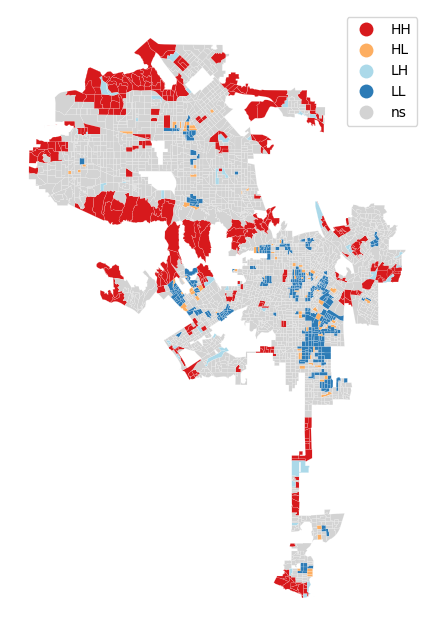

In [68]:
# Import packages for spatial statistics.
import libpysal as lps
import esda
from esda.moran import Moran, Moran_Local
import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

# Calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(bg_priority,k=8)

# Row-standardization
wq.transform = 'r'

y = bg_priority.Priority_Percentile
moran = Moran(y, wq)
moran.I

# Calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

# Plot statistically significant areas at 0.05 alpha level.
fig, ax = plt.subplots(figsize=(8,8))
lisa_cluster(lisa, bg_priority, p=0.05, ax=ax)
plt.show()

We have to save this output as a dataframe to be able to use it in analysis and customize the plot.

In [69]:
# First I followed this documentation (https://github.com/pysal/splot/blob/main/splot/_viz_utils.py)
# This code creates a function to return an array of cluster memberships at a given level of significance.
def moran_hot_cold_spots(moran_loc, p=0.05):
    sig = 1 * (moran_loc.p_sim < p)
    HH = 1 * (sig * moran_loc.q == 1)
    LL = 3 * (sig * moran_loc.q == 3)
    LH = 2 * (sig * moran_loc.q == 2)
    HL = 4 * (sig * moran_loc.q == 4)
    cluster = HH + LL + LH + HL
    return cluster

# Call function (results in an array).
cluster_results=moran_hot_cold_spots(lisa, p=0.05)

# Convert array to a dataframe and then merge it with the bg_priority dataframe.
lisa_df = pd.DataFrame(cluster_results,columns = ['lisa'])
bg_priority=bg_priority.reset_index().drop(columns=['index'])
bg_lisa=pd.merge(bg_priority,lisa_df,left_index=True, right_index=True)

# Label each row with its LISA classification.
for index, row in bg_lisa.iterrows():
    if bg_lisa.loc[index, 'lisa']==0:
        bg_lisa.loc[index, 'lisa_type']='ns' 
    elif bg_lisa.loc[index, 'lisa']==1:
        bg_lisa.loc[index, 'lisa_type']='HH'
    elif bg_lisa.loc[index, 'lisa']==2:
        bg_lisa.loc[index, 'lisa_type']='LH' 
    elif bg_lisa.loc[index, 'lisa']==3:
        bg_lisa.loc[index, 'lisa_type']='LL' 
    elif bg_lisa.loc[index, 'lisa']==4:
        bg_lisa.loc[index, 'lisa_type']='HL'

# Specify desired color based on LISA classification.
for index, row in bg_lisa.iterrows():
    if bg_lisa.loc[index, 'lisa_type']=='ns' :
        bg_lisa.loc[index, 'colors']='#d4dadc' 
    elif bg_lisa.loc[index, 'lisa_type']=='HH':
        bg_lisa.loc[index, 'colors']='#a6611a'
    elif bg_lisa.loc[index, 'lisa_type']=='LH':
        bg_lisa.loc[index, 'colors']='#80cdc1' 
    elif bg_lisa.loc[index, 'lisa_type']=='LL' :
        bg_lisa.loc[index, 'colors']='#018571' 
    elif bg_lisa.loc[index, 'lisa_type']=='HL':
        bg_lisa.loc[index, 'colors']='#dfc27d'

Now we can recreate the LISA map but can customize it to fit into our presentation theme.

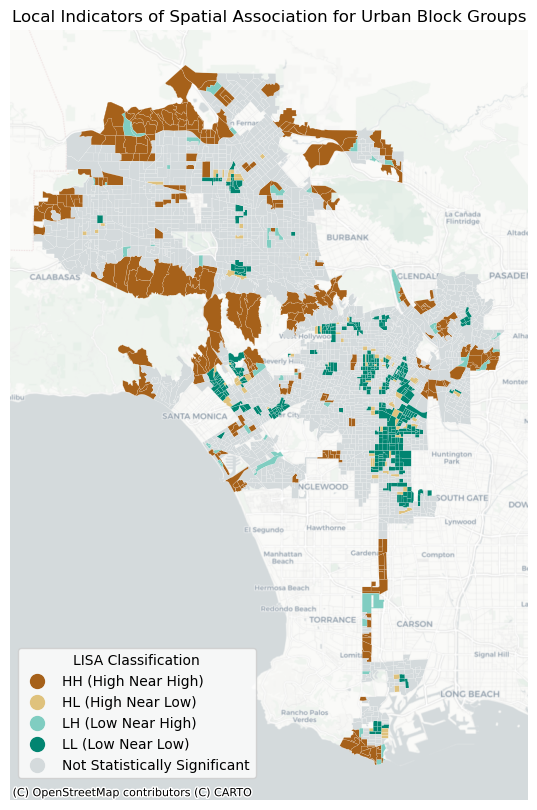

In [70]:
fig, ax = plt.subplots(figsize=(8, 10))
bg_lisa.plot(ax=ax,color=bg_lisa['colors'],edgecolor='white',lw=0.1)

legend_elements = [(Line2D([0], [0], marker='o', color='#a6611a', linestyle='',label='HH (High Near High)', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#dfc27d', linestyle='',label='HL (High Near Low)', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#80cdc1', linestyle='',label='LH (Low Near High)', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#018571', linestyle='',label='LL (Low Near Low)', markersize=10)),
                  (Line2D([0], [0], marker='o', color='#d4dadc', linestyle='',label='Not Statistically Significant', markersize=10))]
fig.legend(handles=legend_elements,loc='lower left',bbox_to_anchor=(0.19,.125), title="LISA Classification")

ax.axis('off')
ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.Positron, crs='epsg:6423')
ax.set_title('Local Indicators of Spatial Association for Urban Block Groups')

plt.savefig('bg_priority_lisa.png',bbox_inches="tight",transparent=True)

Finally, we will calculate what percentage of people in each neighborhood live in a LISA HH area.

In [71]:
# Use a pivot table to summarize the number of people living in each category of area per neighborhood.
lisa_neighborhood=pd.pivot_table(bg_lisa, values='Total Senior Pop', index='Neighborhood', columns='lisa_type', aggfunc='sum').reset_index()

# Calculate the percentage of people living in an HH area.
lisa_neighborhood=lisa_neighborhood.fillna(0)
lisa_neighborhood['urban_senior_population']=lisa_neighborhood['HH']+lisa_neighborhood['HL']+lisa_neighborhood['LH']+lisa_neighborhood['LL']+lisa_neighborhood['ns']
lisa_neighborhood['pct_HH']=lisa_neighborhood['HH']/lisa_neighborhood['urban_senior_population']

# Join in geometry.
urban_boundary=bg_lisa[['geometry','Neighborhood']].dissolve(by='Neighborhood', aggfunc='sum').reset_index()
lisa_neighborhood=pd.merge(lisa_neighborhood,urban_boundary,on=['Neighborhood']).set_geometry('geometry')

# Sort.
lisa_neighborhood=lisa_neighborhood.sort_values('pct_HH',ascending=False).reset_index()

lisa_neighborhood.head(10)

,index,Neighborhood,HH,HL,LH,LL,ns,urban_senior_population,pct_HH,geometry
0,50,Lake View Terrace,3043.0,0.0,0.0,0.0,0.0,3043.0,1.000000,"POLYGON ((1965943.888 586872.478, 1965977.847 ..."
1,6,Beverly Crest,1641.0,0.0,0.0,0.0,0.0,1641.0,1.000000,"POLYGON ((1959293.835 570080.220, 1959321.372 ..."
2,78,Shadow Hills,1773.0,0.0,0.0,0.0,0.0,1773.0,1.000000,"MULTIPOLYGON (((1968282.768 579266.375, 196828..."
3,73,Porter Ranch,4129.0,0.0,434.0,0.0,592.0,5155.0,0.800970,"POLYGON ((1948621.159 584363.906, 1948626.834 ..."
4,5,Bel-Air,730.0,0.0,0.0,0.0,247.0,977.0,0.747185,"POLYGON ((1957576.857 564899.012, 1957575.812 ..."
5,72,Playa del Rey,1567.0,0.0,0.0,0.0,872.0,2439.0,0.642476,"MULTIPOLYGON (((1958524.051 550029.553, 195852..."
6,38,Harbor Gateway,2890.0,0.0,282.0,0.0,1526.0,4698.0,0.615155,"POLYGON ((1972301.747 535191.253, 1972299.295 ..."
7,100,West Hills,4402.0,0.0,0.0,0.0,3347.0,7749.0,0.568073,"POLYGON ((1939031.234 576683.137, 1939042.960 ..."
8,16,Chatsworth,5496.0,0.0,0.0,0.0,4827.0,10323.0,0.532403,"MULTIPOLYGON (((1941056.127 582002.139, 194102..."
9,45,Hollywood Hills West,1502.0,0.0,0.0,0.0,1348.0,2850.0,0.527018,"POLYGON ((1963579.451 566268.590, 1963776.199 ..."


In [72]:
for index, row in lisa_neighborhood.iterrows():
    if lisa_neighborhood.loc[index, 'pct_HH']>0.532403:
        lisa_neighborhood.loc[index, 'colors']='#a6611a' 
    else: lisa_neighborhood.loc[index, 'colors']='#d4dadc'

Text(0.5, 1.0, 'Top 10 Neighborhoods by Number of Seniors in a LISA HH Block Group')

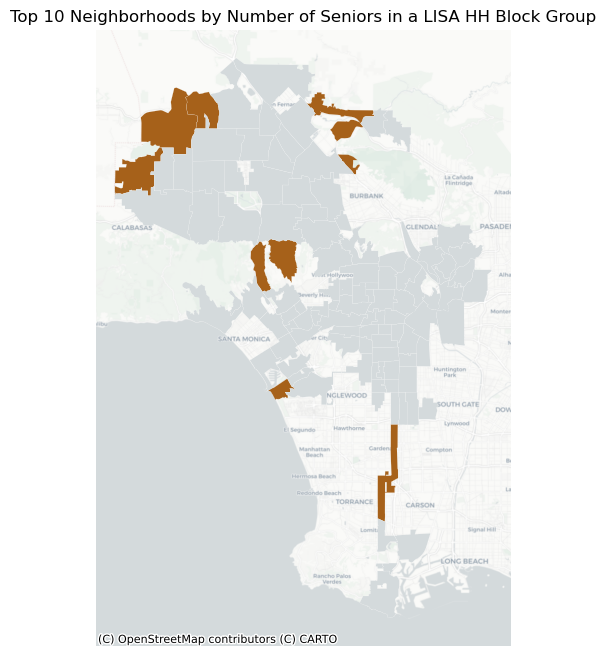

In [73]:
fig, ax = plt.subplots(figsize=(8, 8))
lisa_neighborhood.plot(ax=ax,color=lisa_neighborhood['colors'],edgecolor='white',lw=0.1)
#bg_lisa[bg_lisa['lisa_type']=='HH'].plot(ax=ax,alpha=0.5)
ax.axis('off')
ctx.add_basemap(ax=ax, source=ctx.providers.CartoDB.Positron, crs='epsg:6423')
ax.set_title('Top 10 Neighborhoods by Number of Seniors in a LISA HH Block Group')

Although this analysis is helpful for validating the neighborhood-level analysis, it also masks some of the most important insights generated from the block group-level analysis. Specifically, looking at spatial patterns without being bounded by neighborhood boundaries allows us to see clusters that are masked by the neighborhood analysis because their spatial extents do not align well with Los Angeles neighborhood boundaries. For example, the area of the San Fernando Valley south of Route 101 and the area north of Route I-10 near the Eastside are high priority clusters that do not come up in the neighborhood analysis. For this reason, we find the "Local Indicators of Spatial Association for Urban Block Groups" map to be the most meaningful analysis produced by the block-group level investigation.

### Zoom in on potential priority places

Finally, we can use the following neighborhood mapping function to zoom in on any areas of interest!

In [74]:
# Reimport projected versions of data used below.
neighborhoods=gpd.read_file(
    'https://services5.arcgis.com/7nsPwEMP38bSkCjy/arcgis/rest/services/LA_Times_Neighborhoods/FeatureServer/0/query?outFields=*&where=1%3D1&f=geojson').to_crs('epsg:6423').rename(columns={'name' : 'neighborhood'})
transit_stops=transit_stops.to_crs('epsg:6423')

def neighborhood_map(neighborhood_list):
    # Loop through all neighborhoods to get their combined geographic extent.
    neighborhood_boundary=gpd.GeoDataFrame(columns=['OBJECTID', 'neighborhood', 'geometry'],crs="EPSG:6423")
    for i in neighborhood_list:
        boundary=neighborhoods[(neighborhoods["neighborhood"]==i)]
        neighborhood_boundary = pd.concat([neighborhood_boundary,boundary])
    # Overlay this new geographic extent with the walksheds to get just walksheds within the neighborhoods.    
    neighborhood_walkshed=gpd.overlay(walksheds,neighborhood_boundary,how='intersection', keep_geom_type=None, make_valid=True)
    # Clip point data to get just points within the neighborhoods.
    neighborhood_stores=gpd.clip(grocery_chains,neighborhood_boundary)
    neighborhood_stops=gpd.clip(transit_stops,neighborhood_boundary)
    
    # Set colors.
    neighborhood_boundary["colors"] = '#a6611a'

        
    # Make plot for all of these layers clipped to the desired neighborhoods.
    fig, ax= plt.subplots(figsize=(7,7))
    neighborhood_walkshed.plot(ax=ax,zorder=2,color=neighborhood_walkshed['colors'],alpha=.8)
    neighborhood_boundary.plot(ax=ax,zorder=1,color=neighborhood_boundary['colors'],alpha=0.4)
    neighborhood_stores.plot(ax=ax,zorder=4,marker='X',color='white', edgecolor='black',markersize=50)
    neighborhood_stops.plot(ax=ax,zorder=3,marker='o',color='#FFCF00', edgecolor='black',markersize=10)
    
    # Create custom legend
    from matplotlib.lines import Line2D
    legend_elements = [(Line2D([0], [0], marker='X', color='white', markeredgecolor='black', label='Grocery store location', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#01665e', linestyle='',label='Grocery store within 5 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#35978f', linestyle='',label='Grocery store within 10 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#80cdc1', linestyle='',label='Grocery store within 15 min', markersize=10)),
                      (Line2D([0], [0], marker='o', color='#a6611a', linestyle='',label='No walkable grocery store', markersize=10))]
    ax.legend(handles=legend_elements,loc='upper left', bbox_to_anchor=(1,.9), title="Distance to Nearest Grocery Store")
    
    # Customize axis, title, and basemap.
    ax.axis('off')
    title='Distance to nearest grocery store: '
    for i in neighborhood_list:
        title=title+i+', '
    title=title[:-2]    
    ax.set_title(title)
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs='epsg:6423')

/opt/conda/lib/python3.10/site-packages/geopandas/plotting.py:693: UserWarning:

The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.



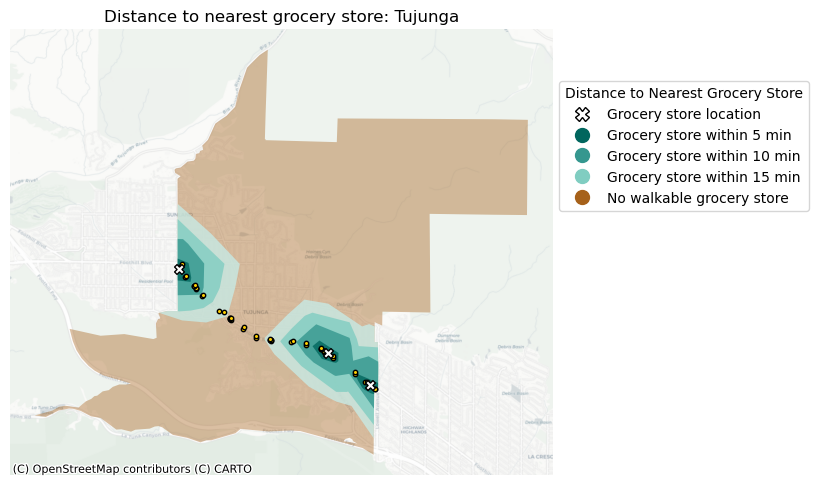

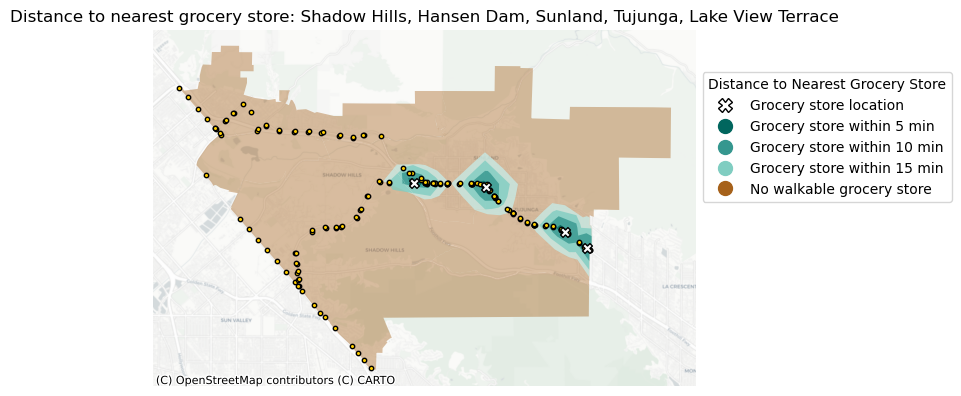

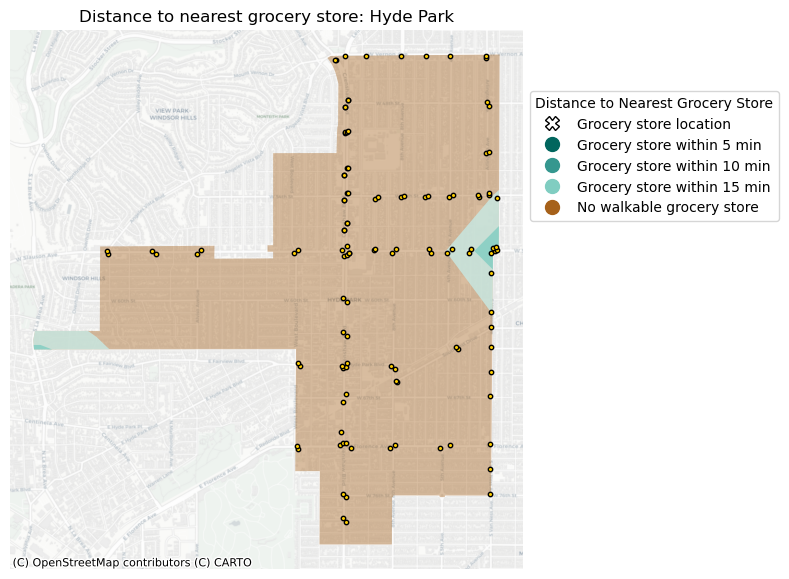

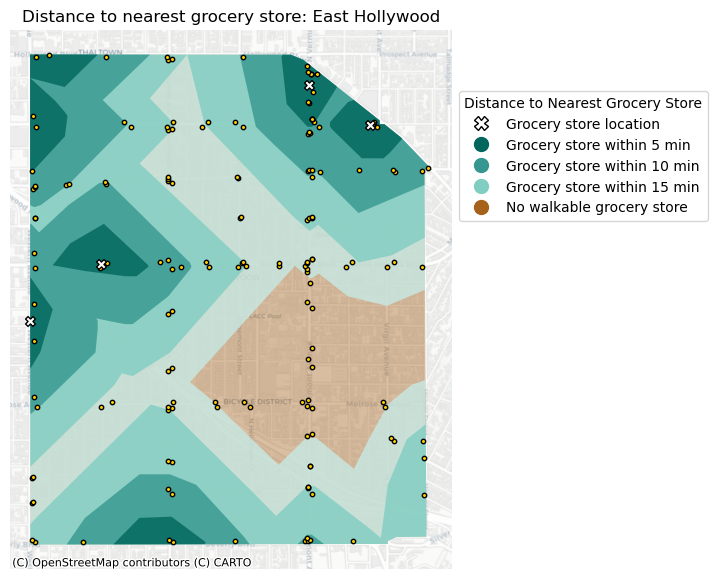

In [75]:
neighborhood_map(['Tujunga'])
neighborhood_map(['Shadow Hills', 'Hansen Dam', 'Sunland', 'Tujunga', 'Lake View Terrace'])
neighborhood_map(['Hyde Park'])
neighborhood_map(['East Hollywood'])

### Division of Labor:
<b>Carolyn:</b> Carolyn focused on analyses related to bus and rail transit and neighborhood prioritization.<br>
<b>Lucy:</b> Lucy focused on analyses related to the senior population and Metro Micro zones.<br>
<b>Monisha:</b> Monisha focused on analyses related to household vehicle access, grocery store access, and local indicators of spatial association.